# [DSF2 - Group 10] SC1015 Data Science and Artificial Intelligence

## Data Science Mini-Project

<br> In this project, we will be modelling a Linear Regression model based off a series of Predictor variables (which will be listed below) to determine a response of our choice.

For the project, we will be using a dataset from Kaggle: **YouTuber Saying Things** by Pranesh Mukhopadhyay.

**Source(s):**
- https://www.kaggle.com/datasets/praneshmukhopadhyay/youtubers-saying-things

### Introduction

<br> Founded and maintained since 2005, YouTube is one of the Internet's largest content creation platforms. With 122+ million daily active users on YouTube consuming more than a billion hours of video every day, YouTube is one of the most widely used social media platforms (and search engines) in the world _(YouTube, 2021)_. 

<br> As of 2020, YouTube was the **fifth most** used social media platform for marketers after Facebook, Instagram, LinkedIn, and Twitter; generating up to **2.6 billion users** _(Statista, 2022)_. In this project, we aim to help advertisers and marketing firms determine whom they should invest in to promote their goods and/or services using the following predictors:

 - Length of Title of Video <br>
 - Number of Subscribers <br>
 - Length of Video <br>

To determine which YouTubers provide the highest return of investment, we will use **Views** to quantify the outreach of the advertisment to users on YouTube. Id est, advertisers and marketing firms should invest in YouTubers that generates the highest the number of views in their videos as it the outreach for their advertisments are greater.

**Source(s):**
 - https://about.youtube/
 - https://www.statista.com/statistics/272014/global-social-networks-ranked-by-number-of-users/

### Importing Essential Libraries

**MiscUtils** is a _self-defined Python Module_. Encapsulated within are the following libraries that are utilised, that enables the Methods defined within the module.
> **NumPy**: Library for Numeric Computations in Python <br>
> **Pandas**: Library for Data Acquisition and Preparation <br>
> **Matplotlib**: Low-level library for Data Visualization <br>
> **Seaborn**: Higher-level library for Data Visualization <br>
> **Regular Expression Operation**: Library for Regular Expression Matching Operations in Python <br>
> **Natural Language Toolkit**: Library for Symbolic Natural Language Processing in Python <br>

To caveat, **MiscUtils** is defined specifically to abstract out functions that were repeated consistently within the Python Notebook.

It should also be noted that **MiscUtils** is designed specifically for our this Data Science Project, with this specific dataset. The module should not be reused for other Data Science Projects.

In [1]:
# Basic Libraries

import MiscUtils as m
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import re
import warnings
warnings.filterwarnings("ignore")

### Sample Collection

From Kaggle, this is the raw data that we have imported.

In [2]:
yt = pd.read_csv("data.csv")
YouTubeDF = pd.DataFrame(yt)
YouTubeDF.head()

,Id,Channel,Subscribers,Title,CC,URL,Released,Views,Category,Transcript,Length
0,FozCkl1xj-w,JRE Clips,6.28M subscribers,Former CIA Agent Breaks Down Jeffrey Epstein Case,0,https://www.youtube.com/watch?v=FozCkl1xj-w,2 years ago,7.9M views,Blog,the Joe Rogan experience well how about the ot...,13:32
1,RN8yoi-e2yc,Mythical Kitchen,1.9M subscribers,$420 Pizza Hut Stuffed Crust Pizza | Fancy Fas...,1,https://www.youtube.com/watch?v=RN8yoi-e2yc,NaN,2.7M views,Food,"- Oh, that's dirty.\r\n- Wow! - Whoa.\r\n- You...",24:26
2,IugcIAAZJ2M,Munchies,4.59M subscribers,The Iconic $1 Pizza Slice of NYC | Street Food...,0,https://www.youtube.com/watch?v=IugcIAAZJ2M,2 years ago,11M views,Food,if you want good pizza come to st marks it's t...,7:51
3,JiEO6F8i0eU,Parks and Recreation,282K subscribers,Ron Swanson: The Papa of Pawnee | Parks and Re...,0,https://www.youtube.com/watch?v=JiEO6F8i0eU,3 years ago,2.3M views,"Entertainment,Comedy",April where have you been over two phone calls...,10:06
4,1T4XMNN4bNM,Vsauce,17.4M subscribers,What's The Most Dangerous Place on Earth?,1,https://www.youtube.com/watch?v=1T4XMNN4bNM,9 years ago,21M views,Science,"Hey, Vsauce. Michael here. 93% of all the\r\nh...",9:29


Description of the dataset, as available from Kaggle, is as follows: <br>

> **ID** : Unique ID for the video. <br>
> **Channel** : Name of the YouTube channel. <br>
> **Subscribers** : How many subscribers did the channel have when creating the dataset. <br>
> **Title** : Title of the video. <br>
> **CC** : Categorical data. Did the video have manual subtitles? <br>
> **URL** : URL of the video. <br>
> **Released** : When the video was released. <br>
> **Views** : How many views did the video have when creating the dataset. <br>
> **Category** : Category of the channel. <br>
> **Transcript** : Subtitle of the video. <br>
> **Length** : Duration of the video. <br>

### Data Preparation

From the raw dataset, there are certain columns of data that we think are irrelevant to our model, namely ID, and URL. Thus, we will remove it from our dataset.

In [3]:
cleanDF = YouTubeDF.drop(columns = ['Id', 'URL'])
cleanDF.head()

,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length
0,JRE Clips,6.28M subscribers,Former CIA Agent Breaks Down Jeffrey Epstein Case,0,2 years ago,7.9M views,Blog,the Joe Rogan experience well how about the ot...,13:32
1,Mythical Kitchen,1.9M subscribers,$420 Pizza Hut Stuffed Crust Pizza | Fancy Fas...,1,NaN,2.7M views,Food,"- Oh, that's dirty.\r\n- Wow! - Whoa.\r\n- You...",24:26
2,Munchies,4.59M subscribers,The Iconic $1 Pizza Slice of NYC | Street Food...,0,2 years ago,11M views,Food,if you want good pizza come to st marks it's t...,7:51
3,Parks and Recreation,282K subscribers,Ron Swanson: The Papa of Pawnee | Parks and Re...,0,3 years ago,2.3M views,"Entertainment,Comedy",April where have you been over two phone calls...,10:06
4,Vsauce,17.4M subscribers,What's The Most Dangerous Place on Earth?,1,9 years ago,21M views,Science,"Hey, Vsauce. Michael here. 93% of all the\r\nh...",9:29


In [4]:
cleanDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Channel      2515 non-null   object
 1   Subscribers  2515 non-null   object
 2   Title        2515 non-null   object
 3   CC           2515 non-null   int64 
 4   Released     2098 non-null   object
 5   Views        2515 non-null   object
 6   Category     2515 non-null   object
 7   Transcript   2515 non-null   object
 8   Length       2515 non-null   object
dtypes: int64(1), object(8)
memory usage: 177.0+ KB


Upon some preliminary exploration of data, it can be seen that there are data points that do not have a release date for its video. We will not consider these data for our model, thus we will be removing them from our dataframe.

In [5]:
cleanDF = cleanDF.dropna()
cleanDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2098 entries, 0 to 2514
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Channel      2098 non-null   object
 1   Subscribers  2098 non-null   object
 2   Title        2098 non-null   object
 3   CC           2098 non-null   int64 
 4   Released     2098 non-null   object
 5   Views        2098 non-null   object
 6   Category     2098 non-null   object
 7   Transcript   2098 non-null   object
 8   Length       2098 non-null   object
dtypes: int64(1), object(8)
memory usage: 163.9+ KB


From further observation, we noted that the relevant data that we require for our model is **not the specified data type** that we intend to use for exploratory analysis. We will further clean the data to maximise its utility.

<br> For example, **Subscribers** and **Released** are of Dtype _Object_. We will now convert them into of Dtype _Int64_.

In [6]:
cleanDF['Subscribers'] = cleanDF['Subscribers'].str.replace("subscribers", "")

for i in range(len(cleanDF['Subscribers'])):
    if "M" in cleanDF['Subscribers'].iloc[i]:
        cleanDF['Subscribers'].iloc[i] = cleanDF['Subscribers'].iloc[i].replace("M", "")
        cleanDF['Subscribers'].iloc[i] = float(cleanDF['Subscribers'].iloc[i])
        cleanDF['Subscribers'].iloc[i] *= float(1000000)
        cleanDF['Subscribers'].iloc[i] = int(cleanDF['Subscribers'].iloc[i])
        
    elif "K" in cleanDF['Subscribers'].iloc[i]:
        cleanDF['Subscribers'].iloc[i] = cleanDF['Subscribers'].iloc[i].replace("K", "")
        cleanDF['Subscribers'].iloc[i] = float(cleanDF['Subscribers'].iloc[i])
        cleanDF['Subscribers'].iloc[i] *= float(1000)
        cleanDF['Subscribers'].iloc[i] = int(cleanDF['Subscribers'].iloc[i])
        
cleanDF['Subscribers'] = cleanDF['Subscribers'].astype('int64')

In [7]:
cleanDF = cleanDF[~cleanDF.Released.str.contains(" weeks ago")]

for i in range(len(cleanDF['Released'])):
    if " years ago" in cleanDF['Released'].iloc[i]:
        if "Streamed " in cleanDF['Released'].iloc[i]:
            cleanDF['Released'].iloc[i] = cleanDF['Released'].iloc[i].replace("Streamed ", "")
            
        cleanDF['Released'].iloc[i] = cleanDF['Released'].iloc[i].replace(" years ago", "")
        cleanDF['Released'].iloc[i] = int(cleanDF['Released'].iloc[i])
        cleanDF['Released'].iloc[i] *= 12
        
        
        
    elif " months ago" in cleanDF['Released'].iloc[i]:
        if "Streamed " in cleanDF['Released'].iloc[i]:
            cleanDF['Released'].iloc[i] = cleanDF['Released'].iloc[i].replace("Streamed ", "")
        
        cleanDF['Released'].iloc[i] = cleanDF['Released'].iloc[i].replace(" months ago", "")
        cleanDF['Released'].iloc[i] = int(cleanDF['Released'].iloc[i])
        
cleanDF['Released'] = cleanDF['Released'].astype('int64')

In [8]:
for i in range(len(cleanDF['Views'])):
    if "M views" in cleanDF['Views'].iloc[i]:
        cleanDF['Views'].iloc[i] = cleanDF['Views'].iloc[i].replace("M views", "")
        cleanDF['Views'].iloc[i] = float(cleanDF['Views'].iloc[i])
        cleanDF['Views'].iloc[i] *= float(1000000)
        cleanDF['Views'].iloc[i] = int(cleanDF['Views'].iloc[i])
        
    elif "K views" in cleanDF['Views'].iloc[i]:
        cleanDF['Views'].iloc[i] = cleanDF['Views'].iloc[i].replace("K views", "")
        cleanDF['Views'].iloc[i] = float(cleanDF['Views'].iloc[i])
        cleanDF['Views'].iloc[i] *= float(1000)
        cleanDF['Views'].iloc[i] = int(cleanDF['Views'].iloc[i])
        
cleanDF['Views'] = cleanDF['Views'].astype('int64')

In [9]:
for i in range(len(cleanDF['Length'])):
    sec = cleanDF['Length'].iloc[i][-2:]
    cleanDF['Length'].iloc[i] = cleanDF['Length'].iloc[i].replace(":", "")
    cleanDF['Length'].iloc[i] = int(cleanDF['Length'].iloc[i])
    sec = int(sec)

    minute = (cleanDF['Length'].iloc[i]-sec) / 100 * 60
    total = minute + sec
    cleanDF['Length'].iloc[i] = total
    
cleanDF['Length'] = cleanDF['Length'].astype('int64')

As alluded to in the introduction, we will be using **LengthOfTitle** as a predictor in our model. As seen from the intial provided data set, it is not provided in the data set. We will be deriving this data from **Title** ourselves and including it into the dataframe.

We have imported the Python Library **Regular Expression Operations** which enables us to remove unwanted characters within the **Title**, such as punctuations and special characters.

In [10]:
lengthOfTitle = []

for i in range(len(cleanDF['Title'])):
    length = len(re.findall(r'\w+', cleanDF['Title'].iloc[i]))
    lengthOfTitle.append(length)
    
cleanDF['LengthOfTitle'] = lengthOfTitle

In [11]:
cleanDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2087 entries, 0 to 2514
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Channel        2087 non-null   object
 1   Subscribers    2087 non-null   int64 
 2   Title          2087 non-null   object
 3   CC             2087 non-null   int64 
 4   Released       2087 non-null   int64 
 5   Views          2087 non-null   int64 
 6   Category       2087 non-null   object
 7   Transcript     2087 non-null   object
 8   Length         2087 non-null   int64 
 9   LengthOfTitle  2087 non-null   int64 
dtypes: int64(6), object(4)
memory usage: 179.4+ KB


Finally, the data has been reclassified into the preferred data type of our choice.

In [12]:
cleanDF['Category'].value_counts()

Science                 274
VideoGames              238
Food                    232
Informative             192
Tech                    165
Automobile              161
News                    140
Blog                    134
Entertainment,Comedy     84
Comedy,Entertainment     84
Automobile,Comedy        69
Entertainment            55
Comedy,Informative       49
Blog,Comedy              44
Comedy                   30
Entertainment,Blog       28
Food,Entertainment       24
Tech,Comedy              22
Tech,Informative         19
Blog,Entertainment       16
Tech,News                16
Blog,Science             11
Name: Category, dtype: int64

From our observation, we noted that certain YouTubers have opted to categorise themselves under two different categories. To simplify our analysis, we will reclassify them under their **primary category**, which is the preceding category.

In [13]:
catList = []
for i in range(len(cleanDF['Category'])):
    catList = cleanDF['Category'].iloc[i].split(',')
    cleanDF['Category'].iloc[i] = catList[0]
    
cleanDF['Category'].value_counts()

Science          274
Food             256
VideoGames       238
Automobile       230
Tech             222
Blog             205
Informative      192
Entertainment    167
Comedy           163
News             140
Name: Category, dtype: int64

Before commencement of Exploratory Analysis, we acknowledge that advertisers and marketing firms may be more inclined towards investing in YouTubers that create content of certain genres or **Category**. Thus, we will be splitting the dataframe into multiple sub-dataframes, grouped by **Category**.

In [14]:
catDict = {}
categoryList = []

test = cleanDF.groupby(cleanDF.Category)
for i in cleanDF['Category'].unique():
    categoryList.append(i)
    catDict[i] = test.get_group(i)
    
for v in catDict.values():
    display(v.head())

,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
0,JRE Clips,6280000,Former CIA Agent Breaks Down Jeffrey Epstein Case,0,24,7900000,Blog,the Joe Rogan experience well how about the ot...,812,8
9,Incognito Mode,1620000,The Roswell Incident,1,48,2200000,Blog,This evening we're going to explore the story....,260,3
10,DramaAlert,5720000,The Hard Truth About FouseyTube,0,36,5500000,Blog,all right all the time is here this house the ...,1330,5
22,Abroad in Japan,2560000,Japan's Most Expensive Beef | Wagyu,1,60,4700000,Blog,If you watch a cooking show or anything on tv ...,827,6
29,Joma in NYC,179000,why I moved to new york city,0,7,534000,Blog,[Music] isn't this gorgeous the rooftop the vi...,365,7


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
2,Munchies,4590000,The Iconic $1 Pizza Slice of NYC | Street Food...,0,24,11000000,Food,if you want good pizza come to st marks it's t...,471,10
11,Epicurious,4010000,How To Slice Every Fruit | Method Mastery | Ep...,1,24,38000000,Food,[Music] oh i'm frank i'm a chef at the institu...,1417,8
24,FoodTribe,379000,James May shocks electricians with vegan hot d...,0,24,590000,Food,viewers welcome back to Jamie's bug out bunker...,815,9
30,Bon Appétit,5930000,Every Way to Cook a Potato (63 Methods) | Bon ...,0,24,9600000,Food,hi i'm emil stonek editor at large at bon appe...,1989,10
48,Gordon Ramsay,18700000,Gordon Ramsay Being Served The Worst Fish Dish...,1,24,27000000,Food,Right nice it's really important me to see as ...,814,11


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
3,Parks and Recreation,282000,Ron Swanson: The Papa of Pawnee | Parks and Re...,0,36,2300000,Entertainment,April where have you been over two phone calls...,606,9
5,Doctor Who,1590000,The Doctor Defeats the Abzorbaloff | Love and ...,1,84,8500000,Entertainment,"Oh, what's the matter?\r\nHave you given up so...",260,10
53,The Graham Norton Show,4080000,Celebrities Impersonating Other Celebrities - ...,1,60,23000000,Entertainment,[Music] / fear man must stand alone Will Smith...,577,8
71,Screen Junkies,6770000,Honest Trailers - Suicide Squad,0,60,12000000,Entertainment,[Music] from the studio that owns awesome hero...,377,4
123,Doctor Who,1590000,The Doctor In The White House | The Impossible...,1,96,3600000,Entertainment,Hello? Who is this? This is President Nixon. W...,261,12


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
4,Vsauce,17400000,What's The Most Dangerous Place on Earth?,1,108,21000000,Science,"Hey, Vsauce. Michael here. 93% of all the\r\nh...",569,8
13,NileRed,3930000,Extracting Lidocaine from Anal Lubricant,0,72,3800000,Science,lidocaine is a pretty potent local anesthetic ...,653,5
33,SmarterEveryDay,10200000,How to Escape from a Car Window (SLOW MOTION) ...,1,72,10000000,Science,Hey it's me Destin Welcome back to Smarter Eve...,455,13
43,Kurzgesagt – In a Nutshell,17700000,The Immune System Explained I – Bacteria Infec...,1,84,38000000,Science,"Every second of your life, you are under attac...",409,7
65,Vsauce,17400000,Which Way Is Down?,1,48,24000000,Science,"Hey, Vsauce. Michael here. Down here. But whic...",1571,4


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
6,A&E,7930000,Live PD: Most Viewed Moments from Walton Count...,1,24,14000000,News,[music playing] We'll be on Laverne Street. It...,1254,11
8,Insider News,216000,We Decoded The Nuclear Weapons At North Korea'...,0,6,583000,News,north korea's arsenal of weapons is growing bu...,437,12
32,BBC News,11300000,Sex addiction: Five times a day 'wasn't enough...,0,36,20000000,News,the addiction got so bad that even if I was ha...,82,11
37,The Daily Show with Trevor Noah,9570000,How Racist Is Boston? | The Daily Show,0,36,7200000,News,whether seriously or thrown around as a joke B...,352,7
45,NBC News,6250000,Exclusive: Full Interview With Russian Preside...,0,7,8199999,News,mr president it's been a long time since you s...,7373,8


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
7,EpicNameBro,389000,Bloodborne with ENB - 016 - Eileen End - Iosef...,0,72,502000,VideoGames,what's up y'all welcome back to your honor met...,1993,8
21,TheWarOwl,1420000,CS:GO Pistols Tutorial,0,72,4000000,VideoGames,greetings I the war al greets you this video i...,737,4
50,Let's Game It Out,3990000,I Turned Valheim Into a Physics-Defying Nightmare,0,10,9100000,VideoGames,hey there it's josh welcome back to let's game...,1327,8
54,LevelCapGaming,1910000,Battlefield 4 Best Guns For All Classes,0,84,2600000,VideoGames,hey guys level-cap here today I'm going to be ...,629,7
83,LGR,1560000,LGR - PC Turbo Buttons,1,72,1700000,VideoGames,The turbo button. To PC gamers of a certain ag...,371,4


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
12,Brooklyn Nine-Nine,847000,Jake & Amy Feels (Vol 1) | Brooklyn Nine-Nine,0,24,3300000,Comedy,Wall Street Journal on the doormat top floor a...,604,8
18,OverSimplified,5920000,Hitler - OverSimplified (Part 1),1,48,29000000,Comedy,"Look at this baby. So gentle, so innocent. You...",390,4
60,Brooklyn Nine-Nine,847000,Introducing The Squad | Brooklyn Nine-Nine,0,36,3200000,Comedy,well Scully Hitchcock and Daniel's they're pre...,108,6
97,Team Coco,8410000,"""American Sniper"" Chris Kyle Interview | CONAN...",0,120,21000000,Comedy,[Music] the book is a huge success and fascina...,290,8
163,Team Coco,8410000,"Melissa Rauch's Accidental ""Big Bang Theory"" M...",0,96,18000000,Comedy,[Music] The Big Bang Theory starting up again ...,143,12


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
16,Austin Evans,5240000,The Ultimate PlayStation Comparison,1,36,6000000,Tech,"- Hey guys, this is Austin, and welcome to the...",912,4
23,Linus Tech Tips,14300000,Does High FPS make you a better gamer? Ft. Shr...,0,24,9500000,Tech,you guys loved our last video using a high-spe...,2172,12
25,Hardware Canucks,1710000,SteelSeries Arctis 5 - the BEST $99 Gaming Hea...,0,48,1400000,Tech,[Music] guys the arctas headset from SteelSeri...,659,8
26,Web Dev Simplified,817000,8 Must Know JavaScript Array Methods,0,36,667000,Tech,arrays are one of the most common things that ...,605,6
35,Austin Evans,5240000,This Will Kill Your Computer,1,60,9700000,Tech,"- I'm nervous. Hey guys, this is Austin, and t...",360,5


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
19,DRIVETRIBE,2060000,James May explains the time he nearly killed J...,0,24,4700000,Automobile,[Music] the closest I've ever come to killing ...,156,10
39,Top Gear,8240000,Truck Driving Challenge Part 1: Rig Stig & Pow...,1,144,15000000,Automobile,"Okay. ""You must now demonstrate\r\nyour lorry ...",472,12
46,The Grand Tour,1820000,"Jeremy Clarkson, Richard Hammond and James May...",0,48,6500000,Automobile,Jeff wants us to be more American the problem ...,74,15
58,Top Gear,8240000,Botswana Adventure Part 1 - Top Gear - BBC,1,156,17000000,Automobile,"""Stretching before you\r\nis the Makgadikgadi....",559,7
61,Throttle House,1850000,2021 Mercedes-Maybach GLS600 vs Rolls-Royce Cu...,0,9,3900000,Automobile,thomas don't do the thing it's not necessary i...,1772,13


,Channel,Subscribers,Title,CC,Released,Views,Category,Transcript,Length,LengthOfTitle
27,Captain Disillusion,2290000,Captain D's Definitive Guide to TRICK SHOTS,1,48,6900000,Informative,So you're a kid or International Brand that wa...,472,8
38,The Infographics Show,11300000,What Is The Deadliest Substance On Earth? Toxi...,1,48,9000000,Informative,Can you imagine settling down to watch a movie...,459,9
49,LEMMiNO,4680000,Top 10 Facts - Humans,1,72,5400000,Informative,It's an ordinary day on a planet Earth Well ...,799,4
56,Sam O'Nella Academy,3380000,Dog Breed Deformities,0,60,13000000,Informative,hey kids let me talk to you about dog breeding...,255,3
74,LEMMiNO,4680000,Top 10 Facts - Undertale,1,72,6200000,Informative,UnderTale is a visually simplistic game in\r\n...,1014,4


### Exploratory Data Analysis

From here, we will attempt to gain meaningful insights from our dataset to determine if certain **Predictors** will positively or negaatively impact our **Response**.

In [15]:
for k, v in catDict.items():
    display(v.describe())
    print("Category:", k)

,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,2.050000e+02,205.000000,205.000000,2.050000e+02,205.000000,205.000000
mean,1.088144e+07,0.331707,29.931707,1.464778e+07,913.951220,7.868293
std,2.315382e+07,0.471979,19.917359,3.300240e+07,523.513833,3.091294
min,1.790000e+05,0.000000,2.000000,1.330000e+05,98.000000,1.000000
25%,2.560000e+06,0.000000,24.000000,2.500000e+06,558.000000,6.000000
50%,3.460000e+06,0.000000,24.000000,4.800000e+06,824.000000,8.000000
75%,6.280000e+06,1.000000,36.000000,9.000000e+06,1158.000000,10.000000
max,8.970000e+07,1.000000,132.000000,2.140000e+08,2919.000000,16.000000


Category: Blog


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,2.560000e+02,256.000000,256.000000,2.560000e+02,256.000000,256.000000
mean,5.341375e+06,0.359375,39.007812,1.161322e+07,864.164062,10.144531
std,5.511629e+06,0.480757,30.354247,1.232106e+07,679.062032,2.842018
min,3.790000e+05,0.000000,2.000000,3.590000e+05,43.000000,4.000000
25%,1.380000e+06,0.000000,24.000000,3.375000e+06,420.500000,8.000000
50%,4.010000e+06,0.000000,24.000000,8.050000e+06,691.000000,10.000000
75%,5.930000e+06,1.000000,48.000000,1.500000e+07,1158.000000,12.000000
max,1.870000e+07,1.000000,144.000000,1.020000e+08,6744.000000,18.000000


Category: Food


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,1.670000e+02,167.000000,167.000000,1.670000e+02,167.000000,167.000000
mean,6.946263e+06,0.622754,60.646707,1.595988e+07,473.239521,8.479042
std,6.676450e+06,0.486155,26.646521,1.254655e+07,396.136936,3.285306
min,2.820000e+05,0.000000,24.000000,2.100000e+06,59.000000,1.000000
25%,1.590000e+06,0.000000,36.000000,5.500000e+06,219.000000,6.000000
50%,6.770000e+06,1.000000,60.000000,1.300000e+07,299.000000,8.000000
75%,7.700000e+06,1.000000,84.000000,2.000000e+07,605.000000,10.000000
max,2.030000e+07,1.000000,108.000000,7.700000e+07,2141.000000,18.000000


Category: Entertainment


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,2.740000e+02,274.000000,274.000000,2.740000e+02,274.000000,274.000000
mean,8.941161e+06,0.784672,47.981752,1.600136e+07,849.810219,7.675182
std,6.978380e+06,0.411802,28.324707,1.964233e+07,459.976883,3.308382
min,3.780000e+05,0.000000,2.000000,2.090000e+05,42.000000,1.000000
25%,3.930000e+06,1.000000,24.000000,3.225000e+06,538.000000,5.000000
50%,4.970000e+06,1.000000,48.000000,9.750000e+06,733.500000,7.000000
75%,1.740000e+07,1.000000,72.000000,2.000000e+07,1092.500000,10.000000
max,2.110000e+07,1.000000,120.000000,1.190000e+08,2635.000000,18.000000


Category: Science


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,1.400000e+02,140.000000,140.000000,1.400000e+02,140.000000,140.000000
mean,7.765957e+06,0.414286,45.450000,1.315840e+07,1410.214286,10.300000
std,4.357102e+06,0.494367,30.056141,9.377520e+06,4629.806915,3.295299
min,2.160000e+05,0.000000,3.000000,5.350000e+05,30.000000,3.000000
25%,3.980000e+06,0.000000,24.000000,7.300000e+06,221.000000,8.000000
50%,7.930000e+06,0.000000,36.000000,1.000000e+07,466.500000,10.500000
75%,1.130000e+07,1.000000,60.000000,1.725000e+07,1137.000000,12.000000
max,1.530000e+07,1.000000,156.000000,5.900000e+07,48319.000000,19.000000


Category: News


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,2.380000e+02,238.000000,238.000000,2.380000e+02,238.000000,238.000000
mean,1.023142e+07,0.432773,61.088235,1.383961e+07,910.294118,7.226891
std,1.144598e+07,0.496504,24.863437,2.781849e+07,1053.148583,3.176754
min,3.890000e+05,0.000000,10.000000,4.760000e+05,56.000000,1.000000
25%,1.560000e+06,0.000000,39.000000,2.200000e+06,463.500000,5.000000
50%,6.800000e+06,0.000000,60.000000,5.950000e+06,683.000000,7.000000
75%,6.980000e+06,1.000000,72.000000,1.600000e+07,994.750000,10.000000
max,3.190000e+07,1.000000,132.000000,3.460000e+08,9420.000000,18.000000


Category: VideoGames


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,1.630000e+02,163.000000,163.000000,1.630000e+02,163.000000,163.000000
mean,4.064252e+06,0.582822,55.012270,1.674847e+07,504.398773,7.042945
std,2.451357e+06,0.494612,29.319228,1.295377e+07,456.519867,2.722448
min,8.470000e+05,0.000000,8.000000,2.500000e+06,54.000000,2.000000
25%,2.720000e+06,0.000000,36.000000,9.150000e+06,183.000000,5.000000
50%,3.350000e+06,1.000000,48.000000,1.500000e+07,419.000000,7.000000
75%,5.920000e+06,1.000000,78.000000,2.100000e+07,603.000000,9.000000
max,8.410000e+06,1.000000,120.000000,9.400000e+07,3231.000000,16.000000


Category: Comedy


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,2.220000e+02,222.000000,222.000000,2.220000e+02,222.000000,222.000000
mean,4.671194e+06,0.292793,35.558559,4.287631e+06,822.549550,7.036036
std,5.185810e+06,0.456072,23.254906,4.982106e+06,1083.561442,2.541699
min,3.060000e+05,0.000000,2.000000,4.700000e+04,16.000000,2.000000
25%,1.090000e+06,0.000000,24.000000,9.377500e+05,385.500000,5.000000
50%,1.710000e+06,0.000000,36.000000,2.100000e+06,549.000000,7.000000
75%,5.240000e+06,1.000000,48.000000,6.900000e+06,890.500000,9.000000
max,1.520000e+07,1.000000,120.000000,3.300000e+07,9511.000000,16.000000


Category: Tech


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,2.300000e+02,230.000000,230.000000,2.300000e+02,230.000000,230.000000
mean,4.192191e+06,0.356522,48.704348,8.446200e+06,676.178261,10.256522
std,3.011170e+06,0.480016,34.366881,8.948475e+06,646.420239,3.342113
min,2.460000e+05,0.000000,2.000000,2.320000e+05,48.000000,4.000000
25%,1.820000e+06,0.000000,24.000000,2.900000e+06,294.250000,8.000000
50%,3.080000e+06,0.000000,48.000000,5.000000e+06,498.500000,10.000000
75%,6.700000e+06,1.000000,69.000000,1.100000e+07,899.250000,12.000000
max,8.690000e+06,1.000000,156.000000,6.100000e+07,7453.000000,21.000000


Category: Automobile


,Subscribers,CC,Released,Views,Length,LengthOfTitle
count,1.920000e+02,192.000000,192.000000,1.920000e+02,192.000000,192.000000
mean,5.261927e+06,0.604167,47.317708,8.621536e+06,820.369792,6.739583
std,3.591139e+06,0.490307,24.432364,6.967169e+06,1582.149904,2.769485
min,1.000000e+06,0.000000,3.000000,8.350000e+05,47.000000,2.000000
25%,2.290000e+06,0.000000,24.000000,4.300000e+06,339.500000,5.000000
50%,3.380000e+06,1.000000,48.000000,8.150000e+06,478.000000,6.000000
75%,1.030000e+07,1.000000,60.000000,1.000000e+07,766.250000,9.000000
max,1.130000e+07,1.000000,132.000000,5.700000e+07,19280.000000,15.000000


Category: Informative


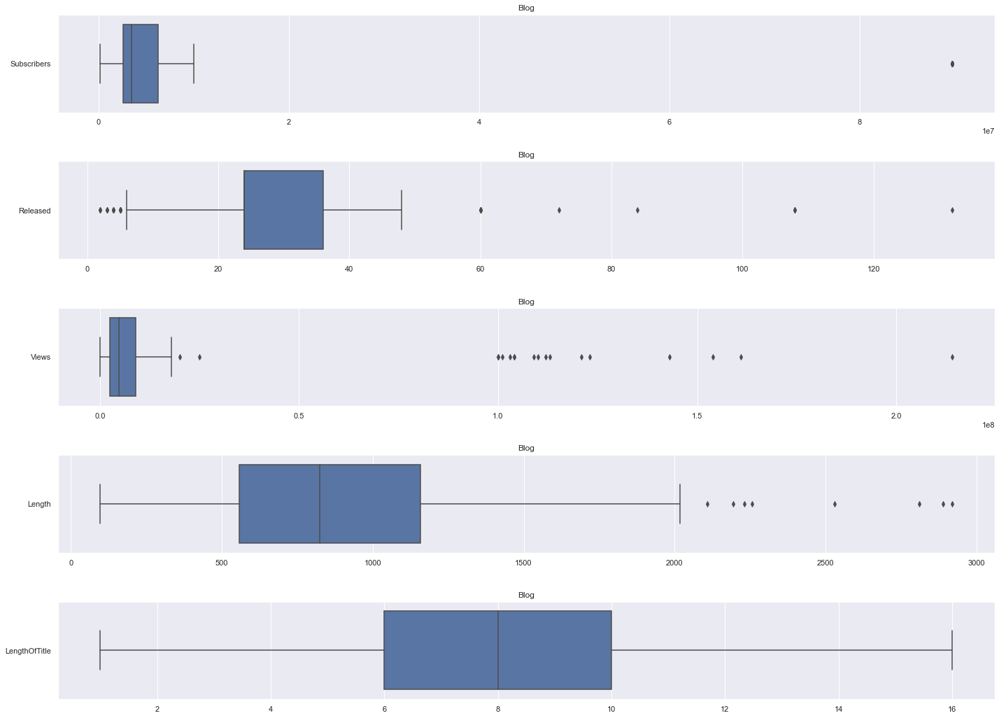

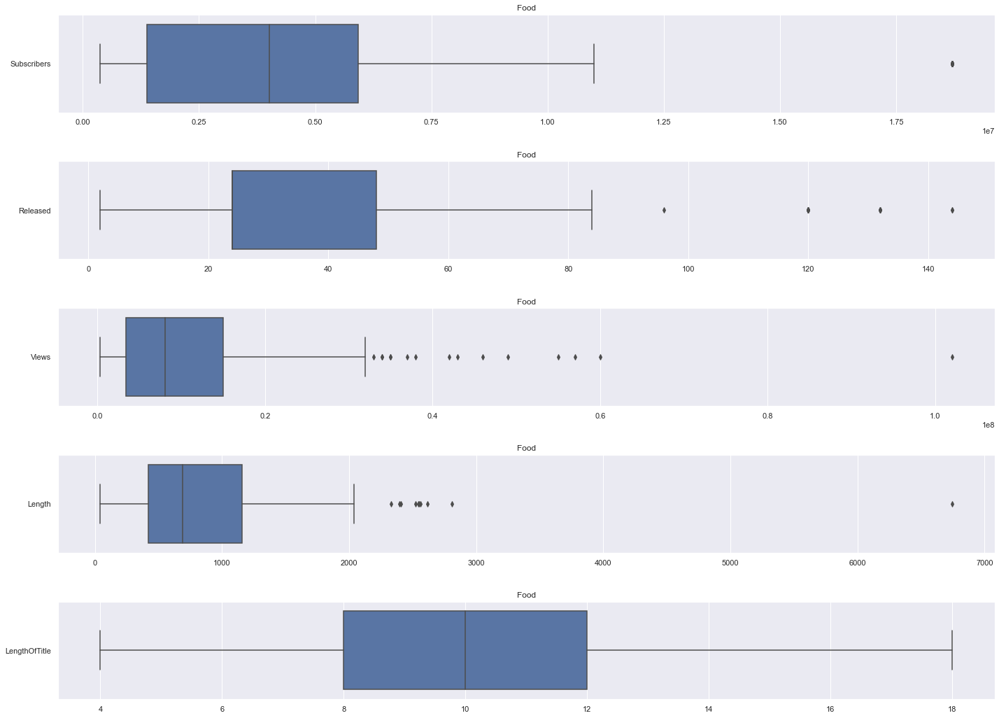

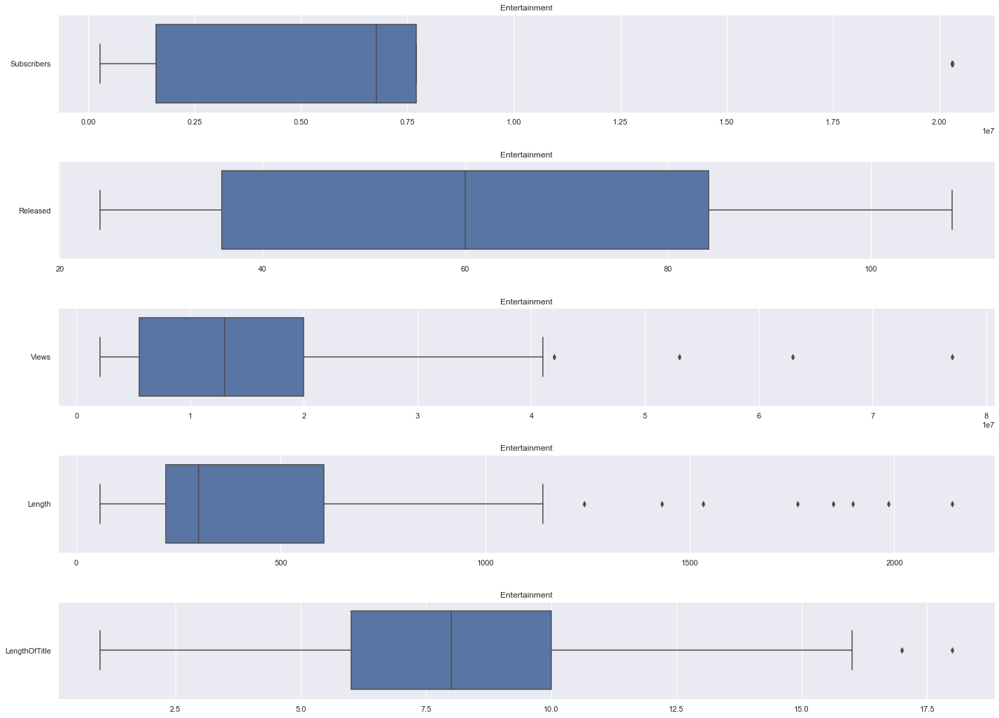

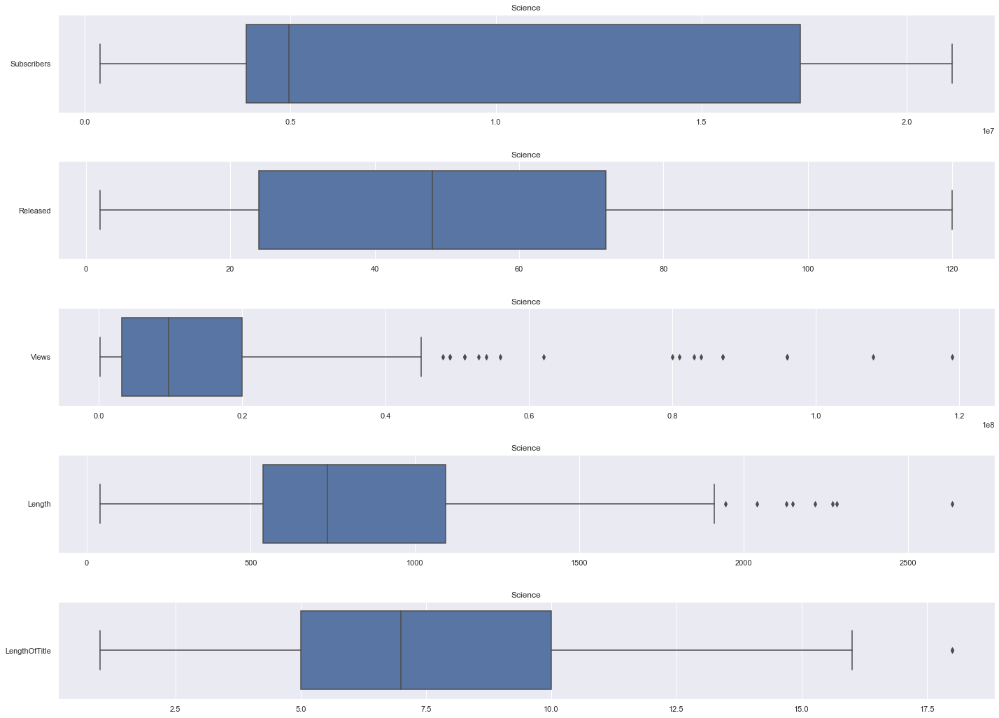

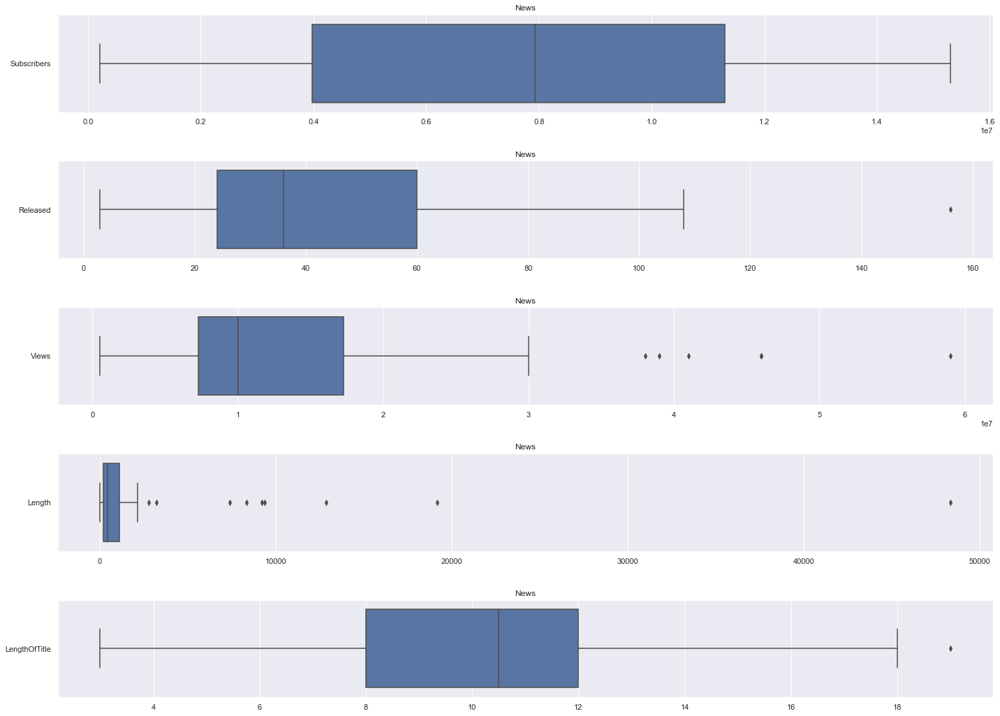

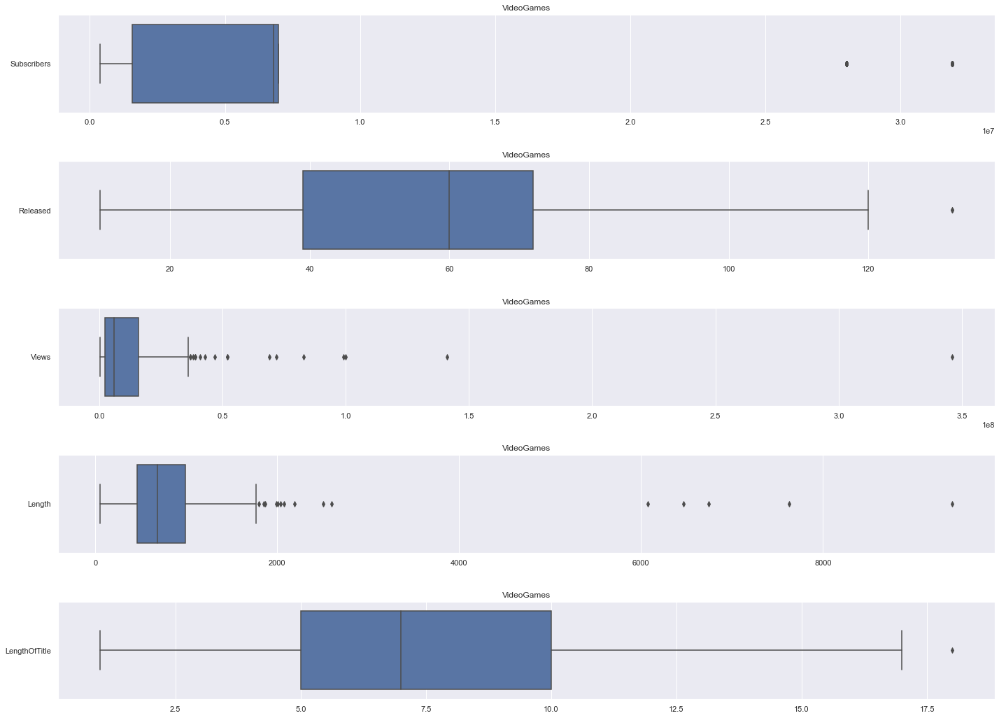

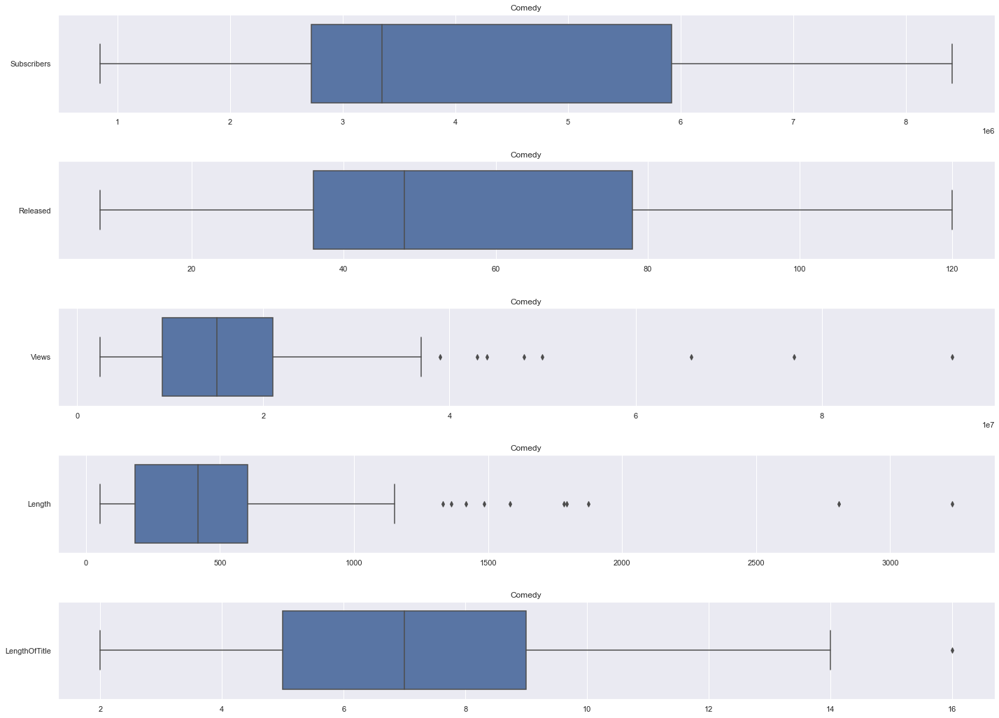

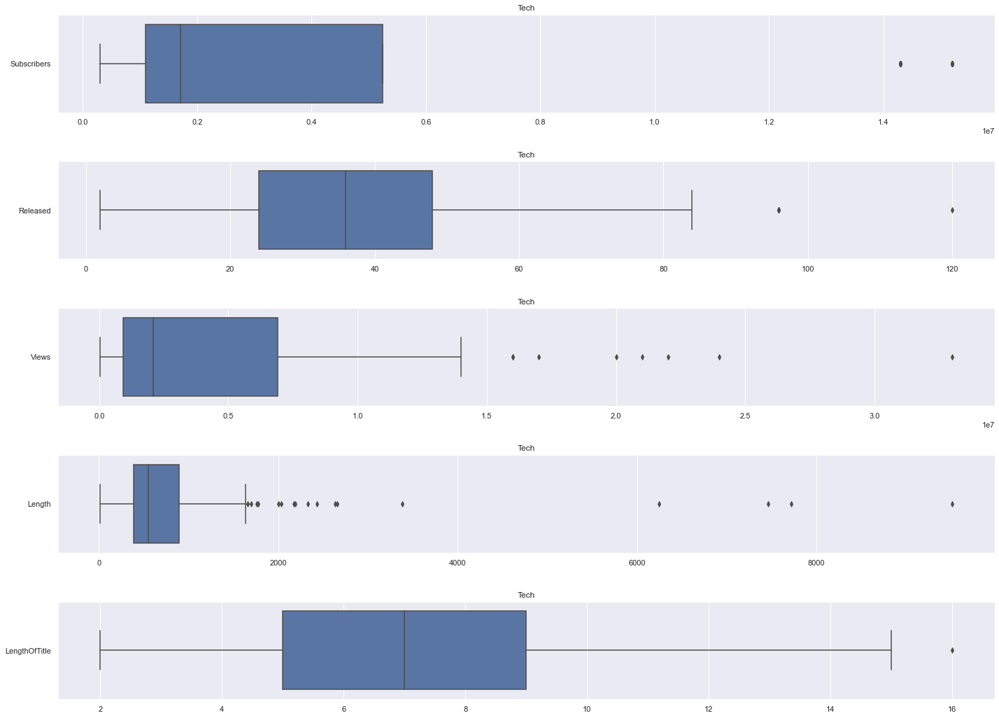

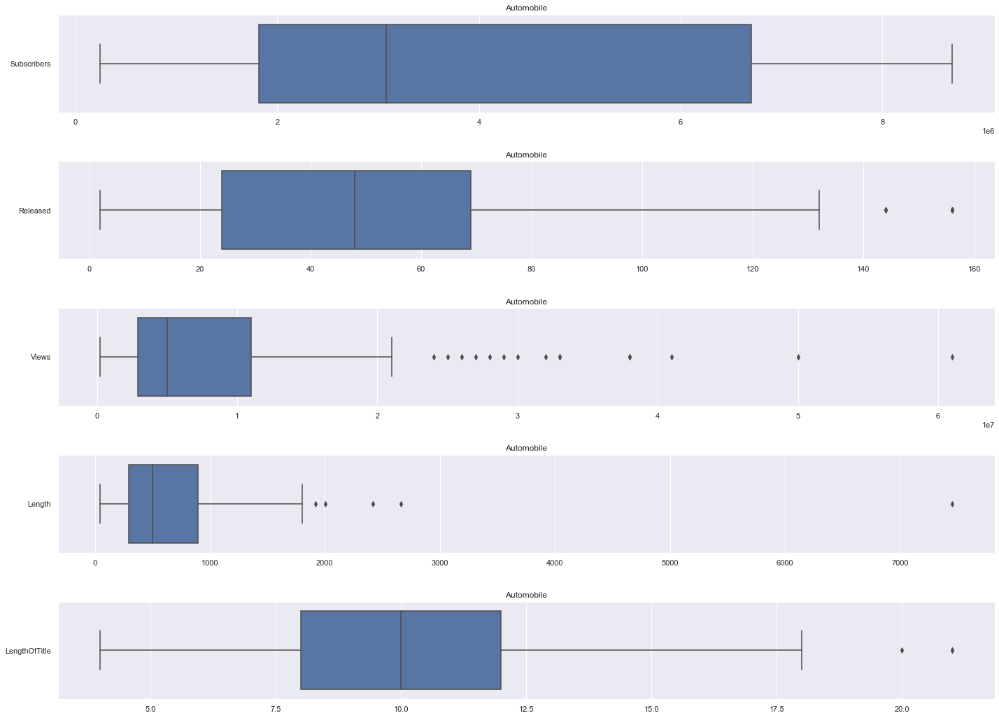

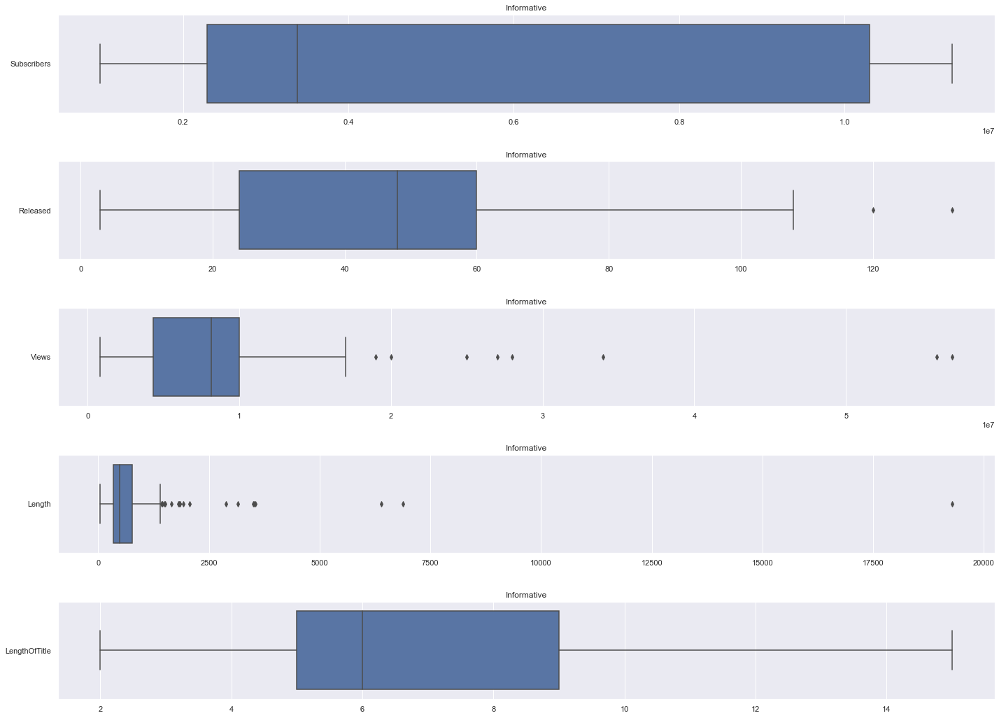

In [16]:
for k, v in catDict.items():
    count = 0
    f, axes = plt.subplots(5, 1, figsize = (24, 18))
    f.subplots_adjust(hspace = 0.5, wspace = 0.125)
    
    for var in v.select_dtypes(include = 'int64'):
        if var != 'CC':
            sb.boxplot(data = pd.DataFrame(v[var]), orient = 'h', ax = axes[count]).set(title = k)
            count += 1

As alluded to above, we will be separating our analysis based on the different **Categories** that are in our dataset. Herein lies the various Machine Learning Models that we will be using.

### Machine Learning Model: Linear Regression Model (By Category)

We have utilised multiple Linear Regression Models, separated by **Category**, to ascertain through a multi-variate approach whether our predictor variables are good in predicting our response variable.

#### Category: Blog

This is the Train-Test Split for the data points categorised under Blog
Train Set : (153, 1) (153, 3)
Test Set  : (52, 1) (52, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.530000e+02
mean,1.396424e+07
std,3.067177e+07
min,1.330000e+05
25%,2.500000e+06
50%,4.300000e+06
75%,8.900000e+06
max,1.610000e+08


,Subscribers,Length,LengthOfTitle
count,1.530000e+02,153.000000,153.000000
mean,1.086388e+07,891.431373,7.764706
std,2.324825e+07,494.575719,3.199023
min,1.790000e+05,98.000000,1.000000
25%,2.560000e+06,555.000000,6.000000
50%,3.460000e+06,798.000000,8.000000
75%,6.280000e+06,1142.000000,10.000000
max,8.970000e+07,2889.000000,16.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

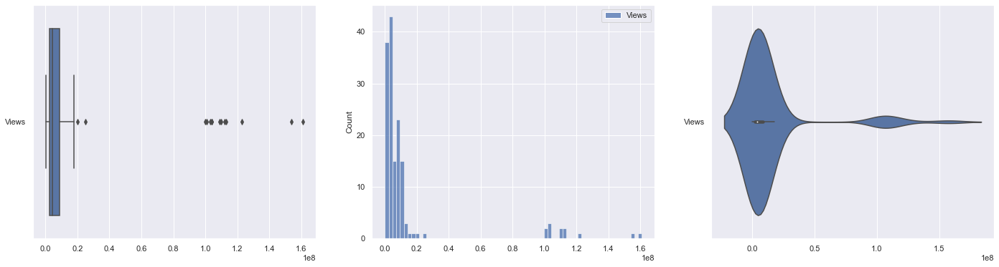


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

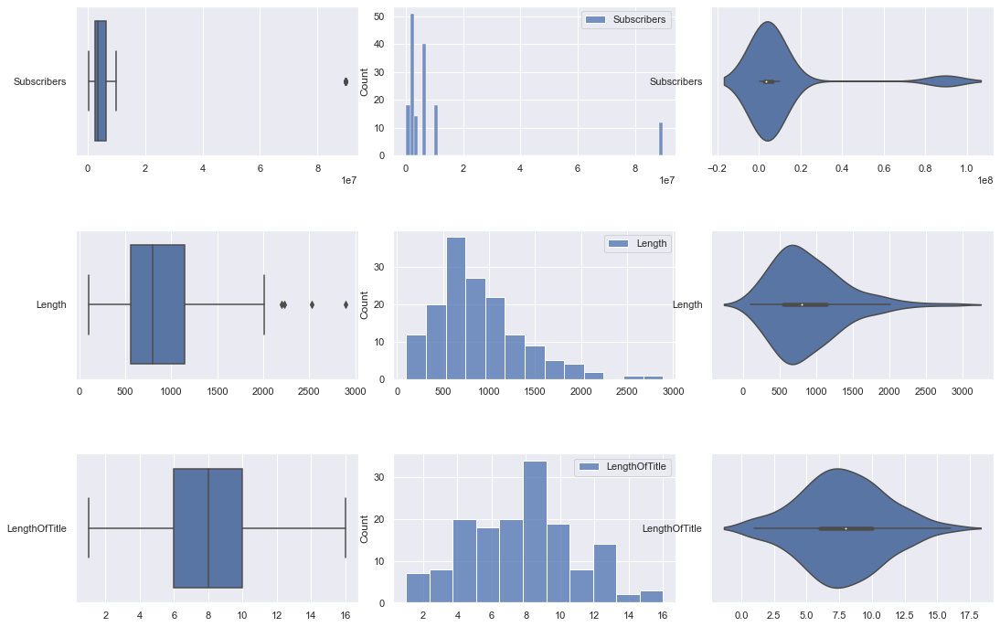


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

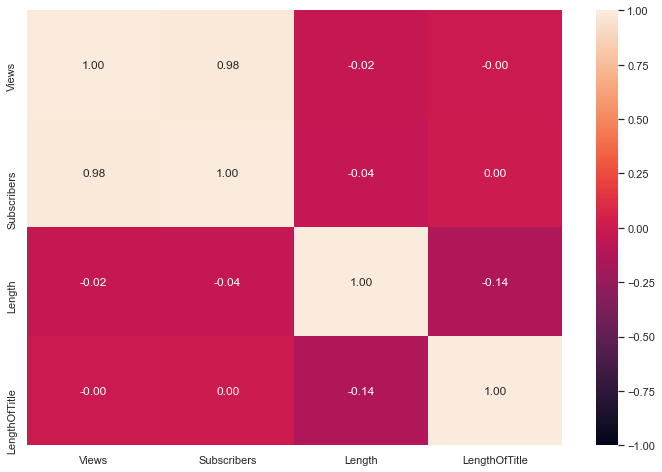

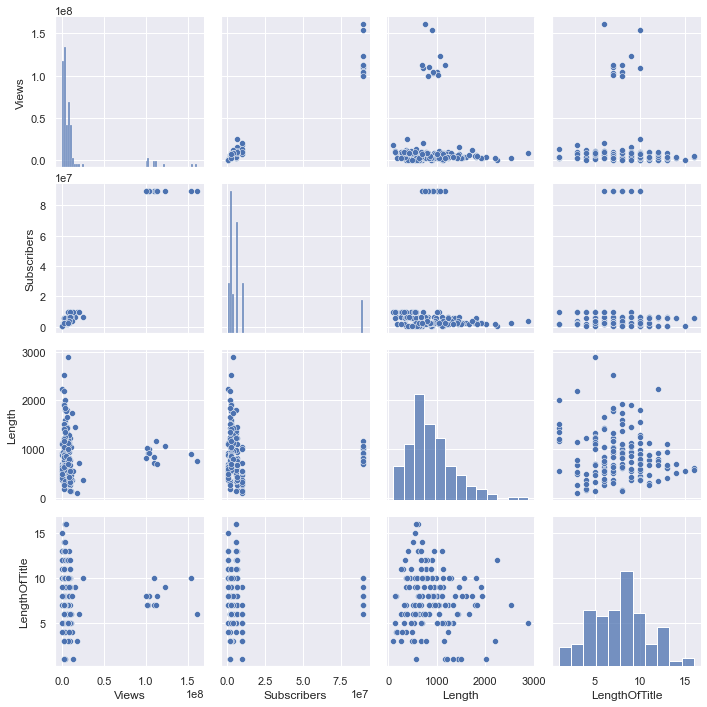


This is the Linear Regression Model based on videos that are categorised under Blog
Intercept of Regression 	: b =  [-324178.2769891]
Coefficients of Regression 	: a =  [[ 1.29280410e+00  7.35151480e+02 -5.30342336e+04]]



<Figure size 432x288 with 0 Axes>

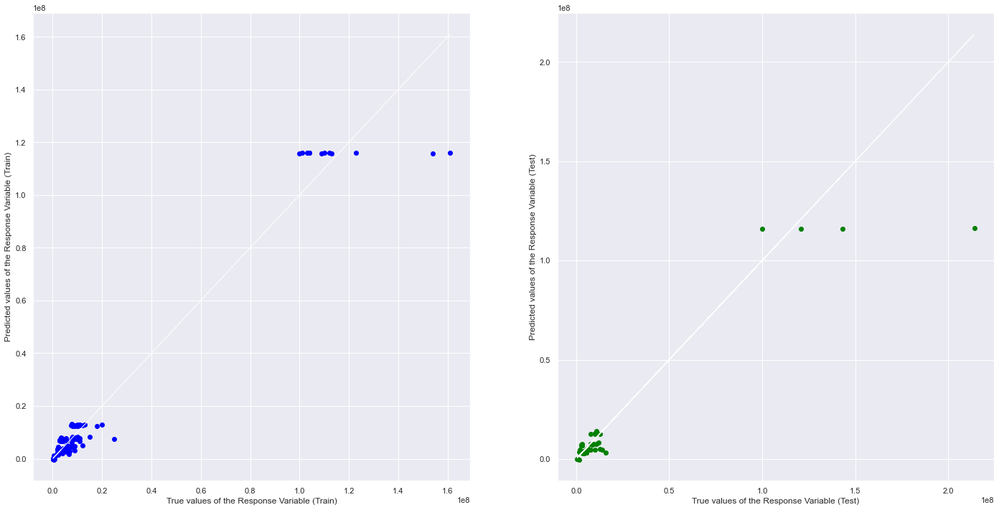


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.9594800486337575
Mean Squared Error (MSE) 	: 37870297405259.984
Root Mean Squared Error (RMSE) 	: 6153884.740979472

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.8584923501268946
Mean Squared Error (MSE) 	: 214741481754449.56
Root Mean Squared Error (RMSE) 	: 14654060.248083107



In [17]:
index = 0
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]])
index += 1

#### Category: Food

This is the Train-Test Split for the data points categorised under Food
Train Set : (192, 1) (192, 3)
Test Set  : (64, 1) (64, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.920000e+02
mean,1.187019e+07
std,1.299143e+07
min,3.590000e+05
25%,3.275000e+06
50%,8.199999e+06
75%,1.500000e+07
max,1.020000e+08


,Subscribers,Length,LengthOfTitle
count,1.920000e+02,192.000000,192.000000
mean,5.277068e+06,857.880208,10.072917
std,5.570846e+06,714.655038,2.748611
min,3.790000e+05,57.000000,4.000000
25%,1.380000e+06,399.250000,8.000000
50%,4.010000e+06,659.000000,10.000000
75%,5.930000e+06,1145.250000,12.000000
max,1.870000e+07,6744.000000,18.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

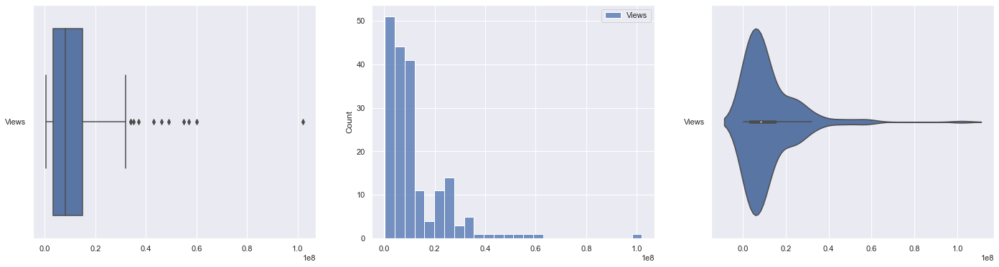


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

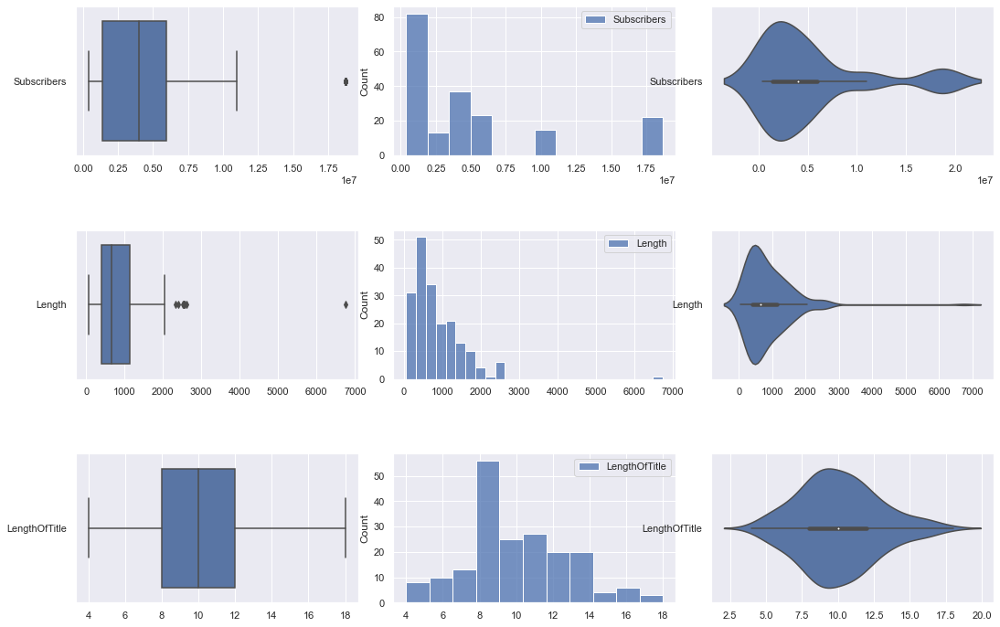


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

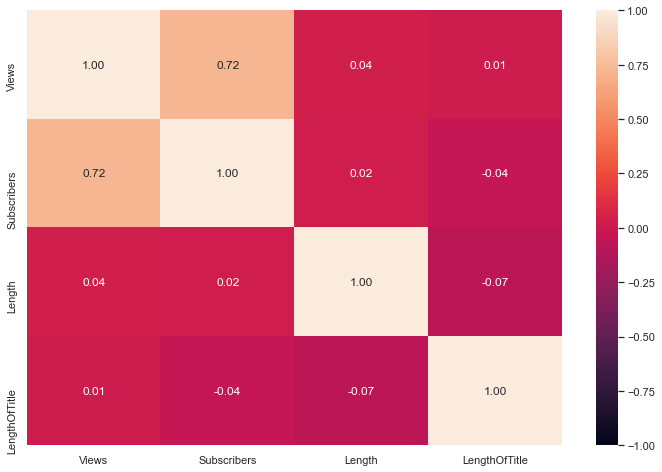

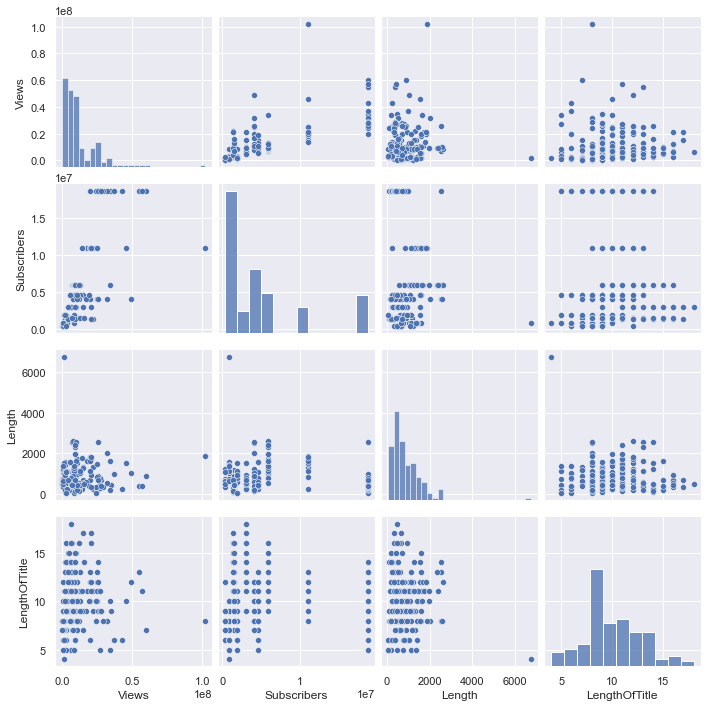


This is the Linear Regression Model based on videos that are categorised under Food
Intercept of Regression 	: b =  [606075.57403073]
Coefficients of Regression 	: a =  [[1.68335389e+00 3.85794922e+02 2.03513930e+05]]



<Figure size 432x288 with 0 Axes>

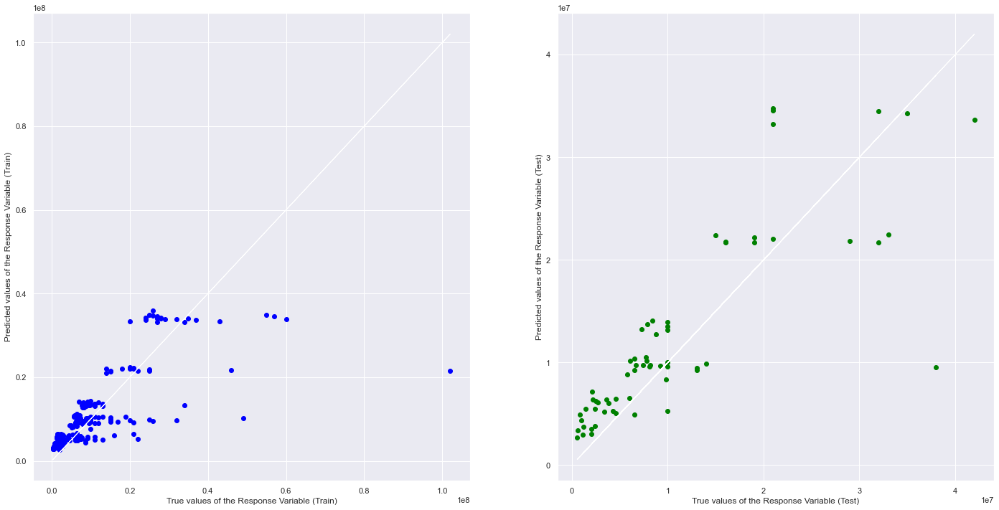


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5216617615002233
Mean Squared Error (MSE) 	: 80312150652256.4
Root Mean Squared Error (RMSE) 	: 8961704.673345156

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.642224380280906
Mean Squared Error (MSE) 	: 35911652297526.29
Root Mean Squared Error (RMSE) 	: 5992633.168943874



In [18]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]], 63)
index += 1

#### Category: Entertainment

This is the Train-Test Split for the data points categorised under Entertainment
Train Set : (125, 1) (125, 3)
Test Set  : (42, 1) (42, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.250000e+02
mean,1.535600e+07
std,1.214460e+07
min,2.100000e+06
25%,5.200000e+06
50%,1.300000e+07
75%,2.000000e+07
max,7.700000e+07


,Subscribers,Length,LengthOfTitle
count,1.250000e+02,125.000000,125.000000
mean,6.677472e+06,475.104000,8.584000
std,6.541563e+06,399.165416,3.248285
min,2.820000e+05,59.000000,1.000000
25%,1.590000e+06,233.000000,6.000000
50%,6.770000e+06,291.000000,8.000000
75%,7.700000e+06,607.000000,10.000000
max,2.030000e+07,1985.000000,18.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

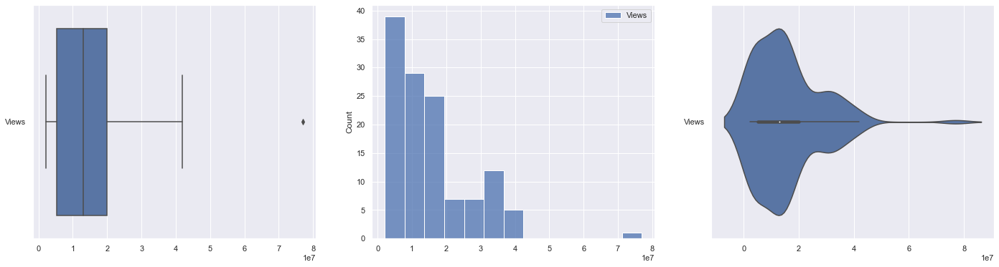


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

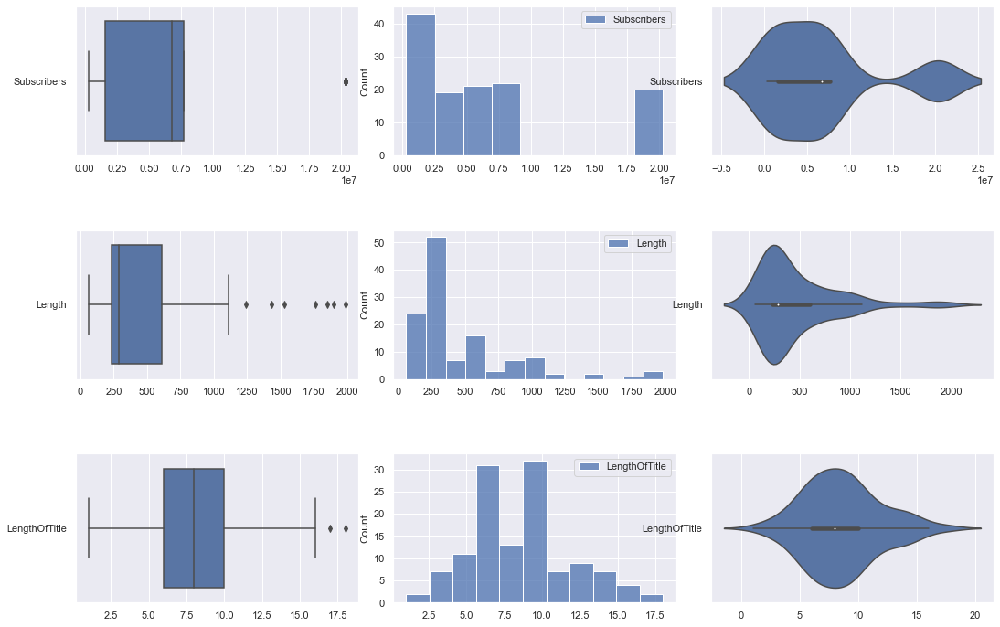


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

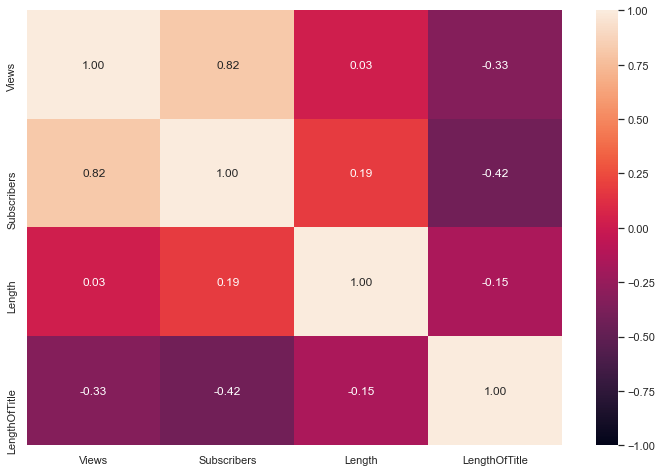

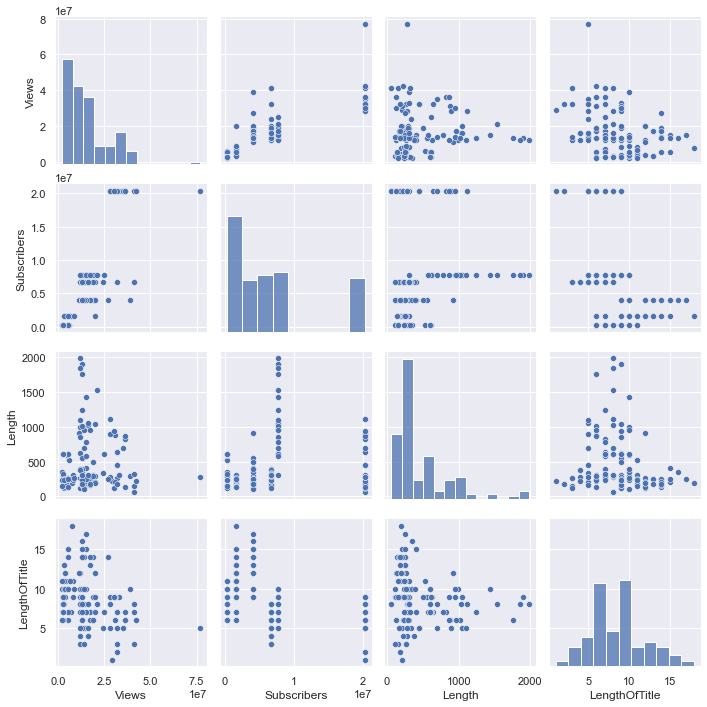


This is the Linear Regression Model based on videos that are categorised under Entertainment
Intercept of Regression 	: b =  [6780651.84706179]
Coefficients of Regression 	: a =  [[ 1.55776112e+00 -3.83898715e+03 -3.07544664e+02]]



<Figure size 432x288 with 0 Axes>

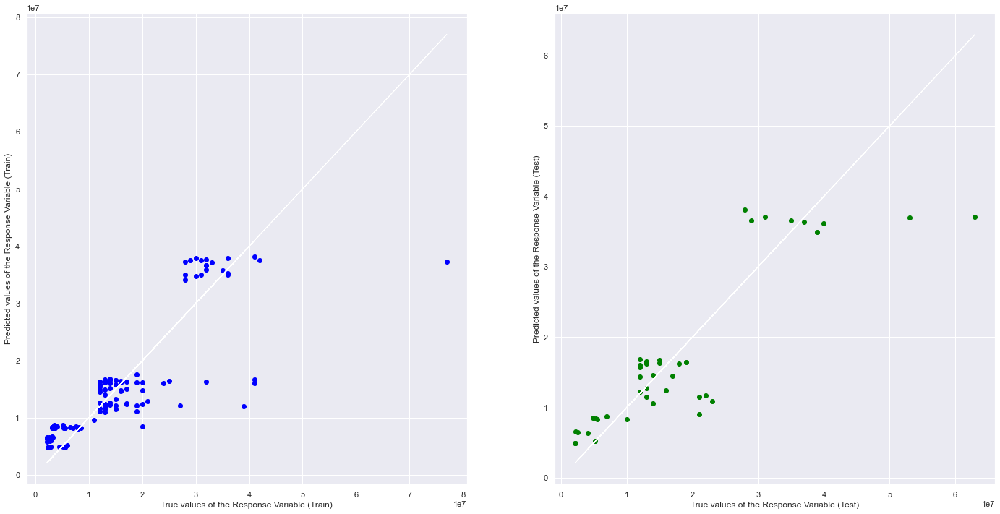


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.6807579868313327
Mean Squared Error (MSE) 	: 46708702526106.58
Root Mean Squared Error (RMSE) 	: 6834376.527972875

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7551179137009982
Mean Squared Error (MSE) 	: 44667092411426.34
Root Mean Squared Error (RMSE) 	: 6683344.403173186



In [19]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]])
index += 1

#### Category: Science

This is the Train-Test Split for the data points categorised under Science
Train Set : (205, 1) (205, 3)
Test Set  : (69, 1) (69, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,2.050000e+02
mean,1.662838e+07
std,2.022232e+07
min,2.090000e+05
25%,3.200000e+06
50%,1.000000e+07
75%,2.100000e+07
max,1.190000e+08


,Subscribers,Length,LengthOfTitle
count,2.050000e+02,205.000000,205.000000
mean,9.153400e+06,853.673171,7.551220
std,7.071606e+06,469.712788,3.343645
min,3.780000e+05,42.000000,1.000000
25%,3.930000e+06,552.000000,5.000000
50%,4.970000e+06,731.000000,7.000000
75%,1.740000e+07,1110.000000,10.000000
max,2.110000e+07,2635.000000,18.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

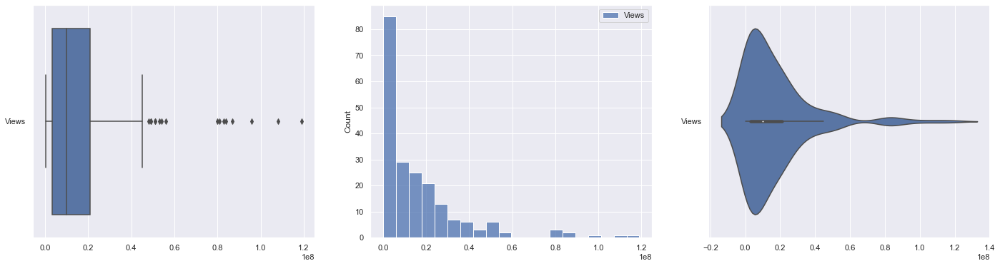


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

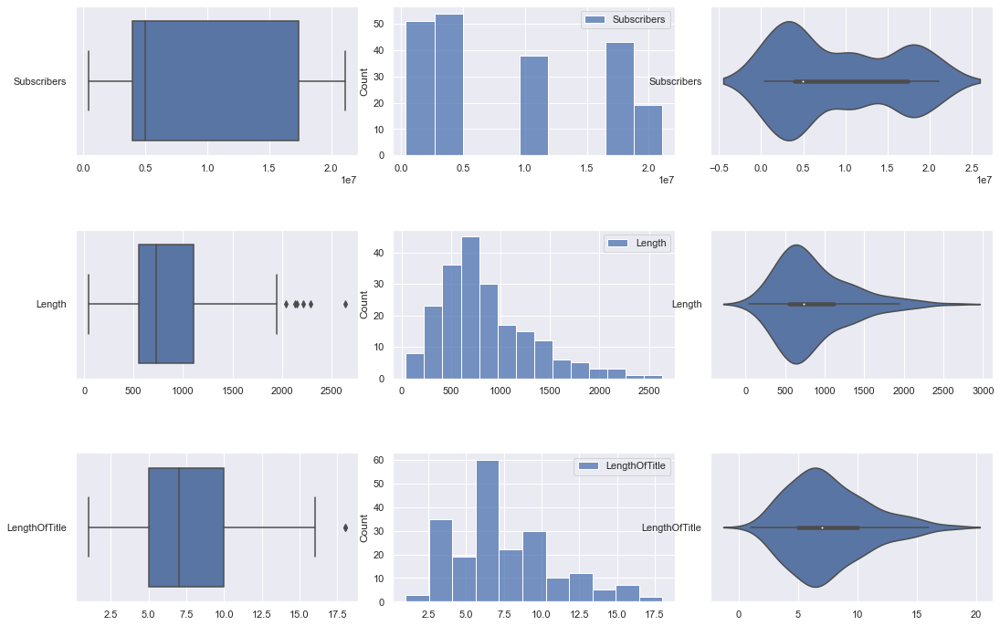


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

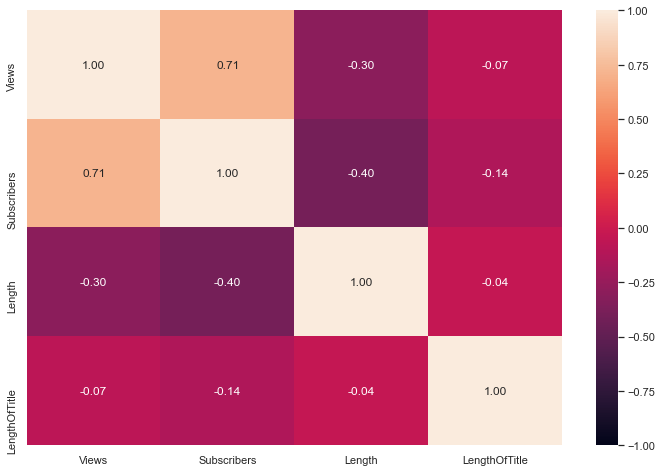

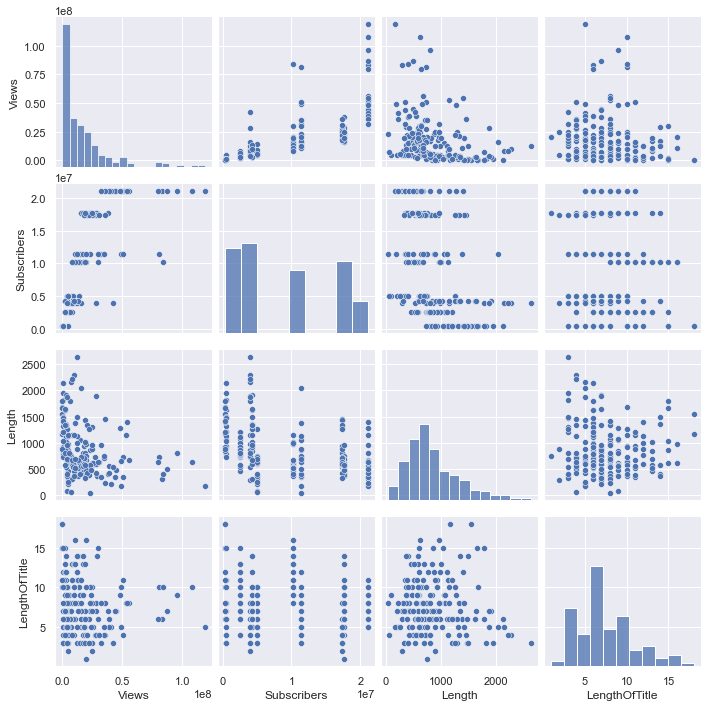


This is the Linear Regression Model based on videos that are categorised under Science
Intercept of Regression 	: b =  [-2598317.10411503]
Coefficients of Regression 	: a =  [[ 2.03155091e+00 -4.16473915e+02  1.30658643e+05]]



<Figure size 432x288 with 0 Axes>

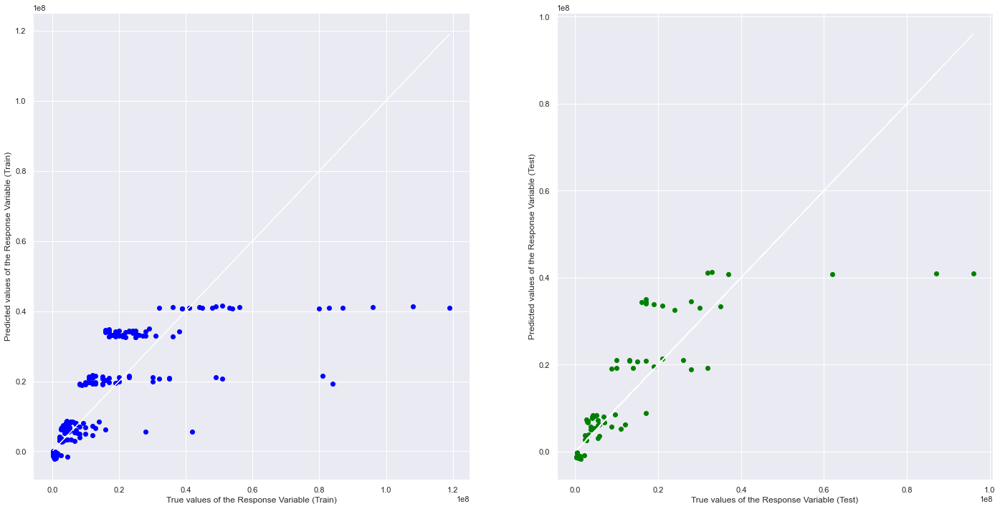


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5066565292715463
Mean Squared Error (MSE) 	: 200764784623052.66
Root Mean Squared Error (RMSE) 	: 14169149.043716516

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5978479830983544
Mean Squared Error (MSE) 	: 125803418896287.95
Root Mean Squared Error (RMSE) 	: 11216212.323966052



In [20]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]], 60)
index += 1

#### Category: News

This is the Train-Test Split for the data points categorised under News
Train Set : (105, 1) (105, 3)
Test Set  : (35, 1) (35, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.050000e+02
mean,1.334466e+07
std,9.144284e+06
min,5.830000e+05
25%,7.200000e+06
50%,1.100000e+07
75%,1.800000e+07
max,4.600000e+07


,Subscribers,Length,LengthOfTitle
count,1.050000e+02,105.000000,105.000000
mean,7.800686e+06,1644.409524,10.438095
std,4.467484e+06,5284.756200,3.469437
min,2.160000e+05,30.000000,3.000000
25%,3.980000e+06,234.000000,8.000000
50%,7.930000e+06,494.000000,11.000000
75%,1.130000e+07,1174.000000,12.000000
max,1.530000e+07,48319.000000,19.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

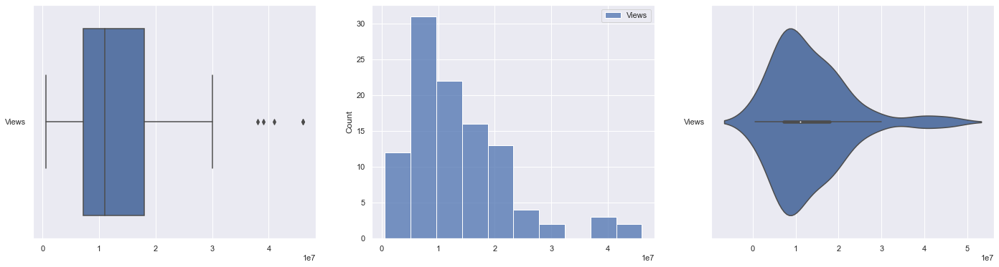


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

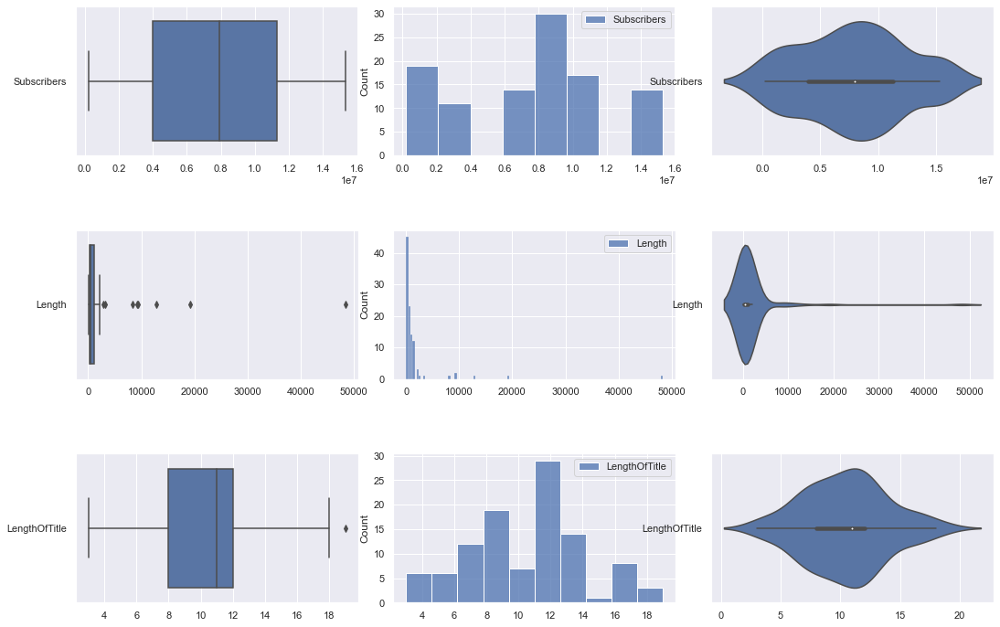


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

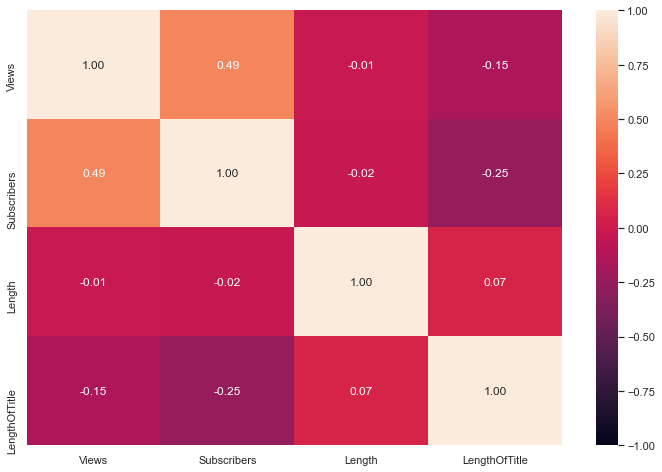

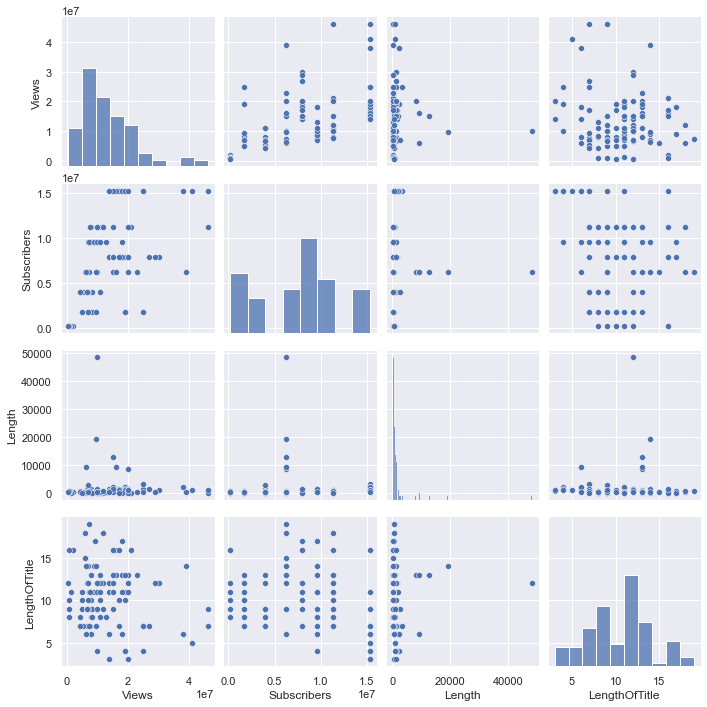


This is the Linear Regression Model based on videos that are categorised under News
Intercept of Regression 	: b =  [6228959.06359127]
Coefficients of Regression 	: a =  [[ 9.98470134e-01  7.73295536e+00 -6.56987481e+04]]



<Figure size 432x288 with 0 Axes>

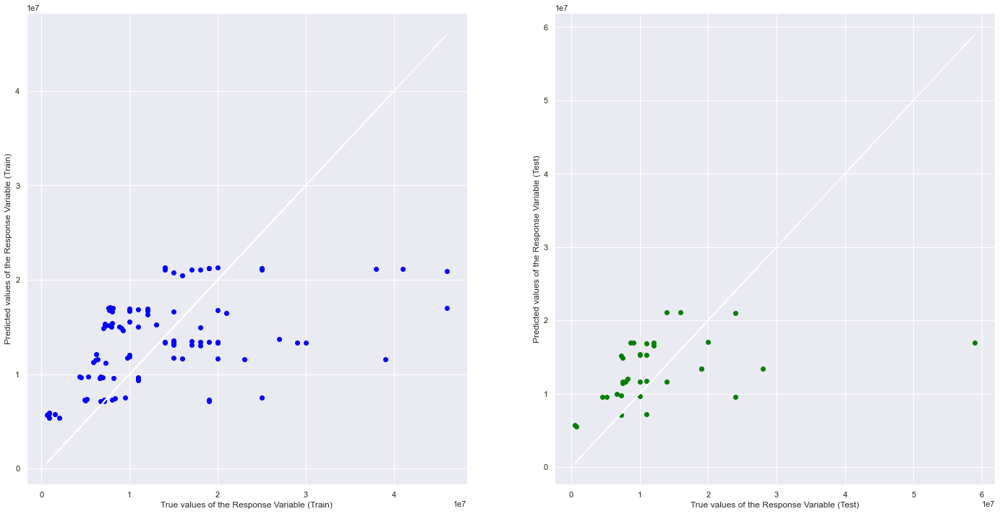


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.24453219791540082
Mean Squared Error (MSE) 	: 62569028704437.69
Root Mean Squared Error (RMSE) 	: 7910058.704234608

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.161313647951982
Mean Squared Error (MSE) 	: 84168868935166.94
Root Mean Squared Error (RMSE) 	: 9174359.320146935



In [21]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]])
index += 1

#### Category: VideoGames

This is the Train-Test Split for the data points categorised under VideoGames
Train Set : (178, 1) (178, 3)
Test Set  : (60, 1) (60, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.780000e+02
mean,1.371212e+07
std,3.076285e+07
min,4.790000e+05
25%,2.100000e+06
50%,5.350000e+06
75%,1.600000e+07
max,3.460000e+08


,Subscribers,Length,LengthOfTitle
count,1.780000e+02,178.000000,178.000000
mean,9.862416e+06,861.741573,7.415730
std,1.130559e+07,906.827207,3.145471
min,3.890000e+05,56.000000,1.000000
25%,1.560000e+06,483.500000,5.000000
50%,6.800000e+06,695.000000,7.000000
75%,6.980000e+06,974.500000,10.000000
max,3.190000e+07,9420.000000,18.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

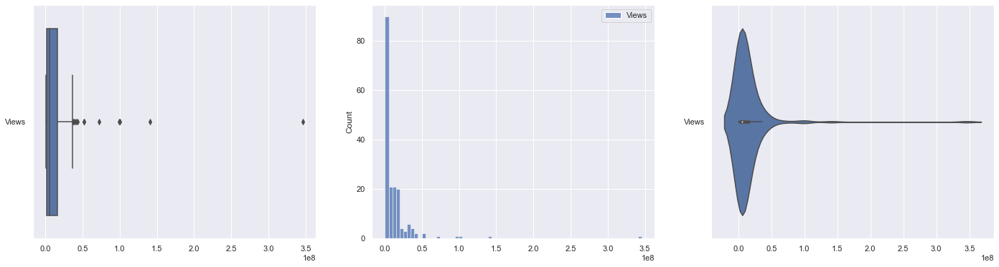


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

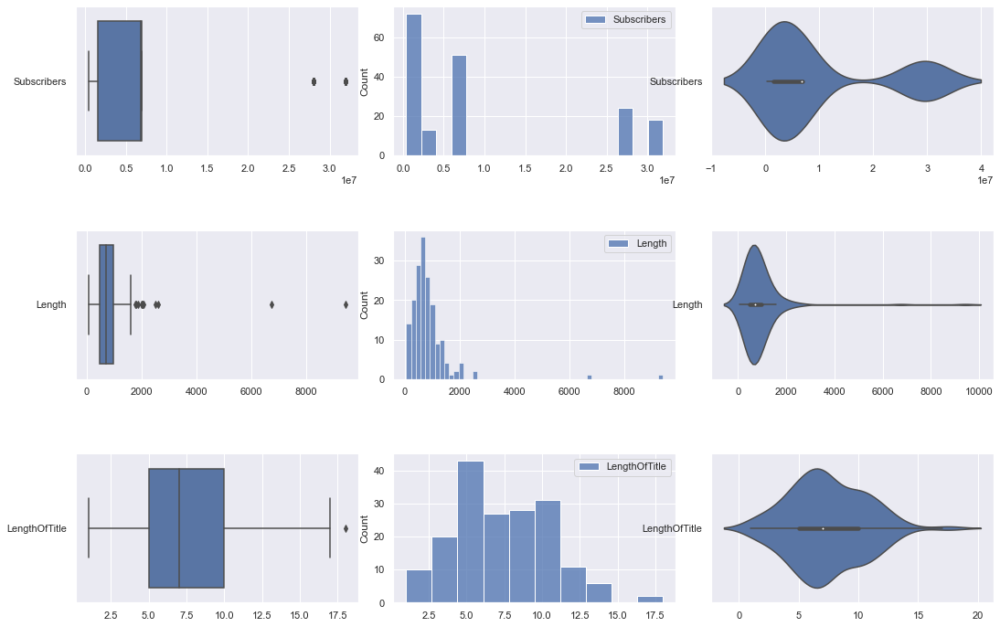


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

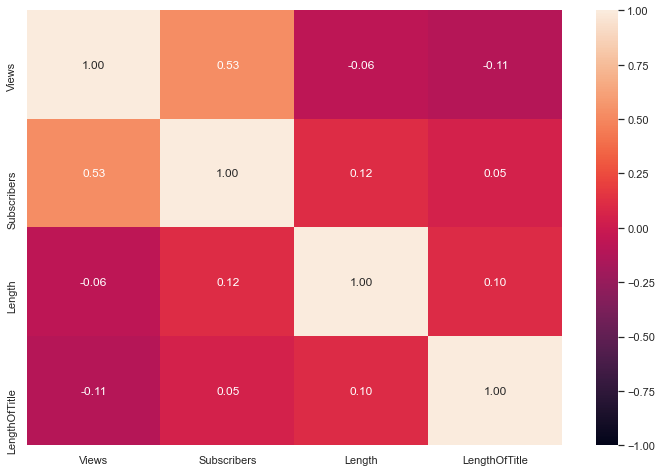

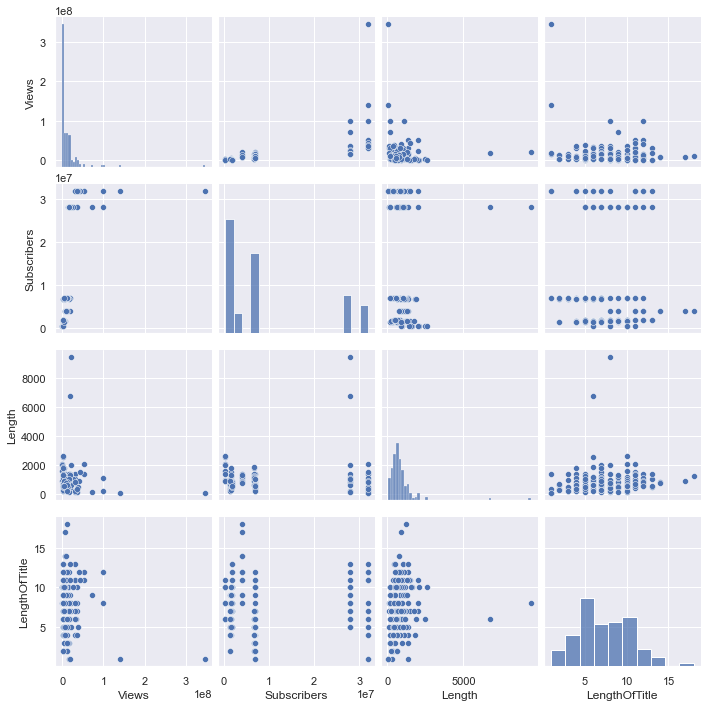


This is the Linear Regression Model based on videos that are categorised under VideoGames
Intercept of Regression 	: b =  [11309405.68752478]
Coefficients of Regression 	: a =  [[ 1.49909154e+00 -3.93910208e+03 -1.21194510e+06]]



<Figure size 432x288 with 0 Axes>

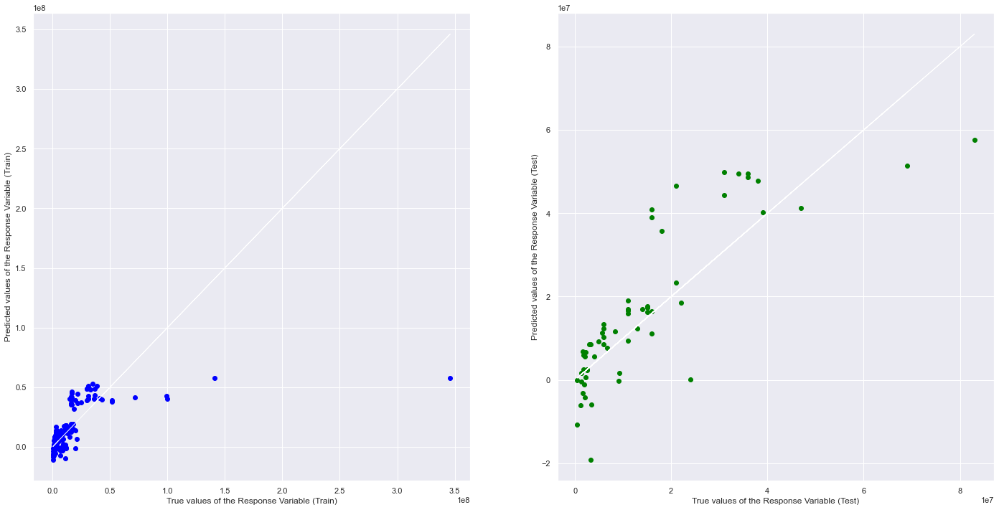


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3132660378849519
Mean Squared Error (MSE) 	: 646241575177562.2
Root Mean Squared Error (RMSE) 	: 25421281.93418975

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5957973888989172
Mean Squared Error (MSE) 	: 107051905730060.66
Root Mean Squared Error (RMSE) 	: 10346589.086750312



In [22]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]], 20)
index += 1

#### Category: Comedy

This is the Train-Test Split for the data points categorised under Comedy
Train Set : (122, 1) (122, 3)
Test Set  : (41, 1) (41, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.220000e+02
mean,1.684262e+07
std,1.309417e+07
min,2.500000e+06
25%,9.925000e+06
50%,1.500000e+07
75%,2.100000e+07
max,9.400000e+07


,Subscribers,Length,LengthOfTitle
count,1.220000e+02,122.000000,122.000000
mean,4.107131e+06,523.434426,7.040984
std,2.419078e+06,496.520271,2.797276
min,8.470000e+05,82.000000,2.000000
25%,2.720000e+06,185.000000,5.000000
50%,3.610000e+06,421.000000,7.000000
75%,5.920000e+06,602.000000,9.000000
max,8.410000e+06,3231.000000,16.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

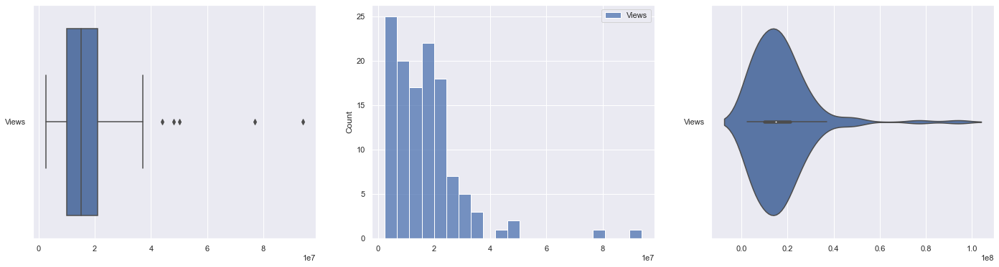


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

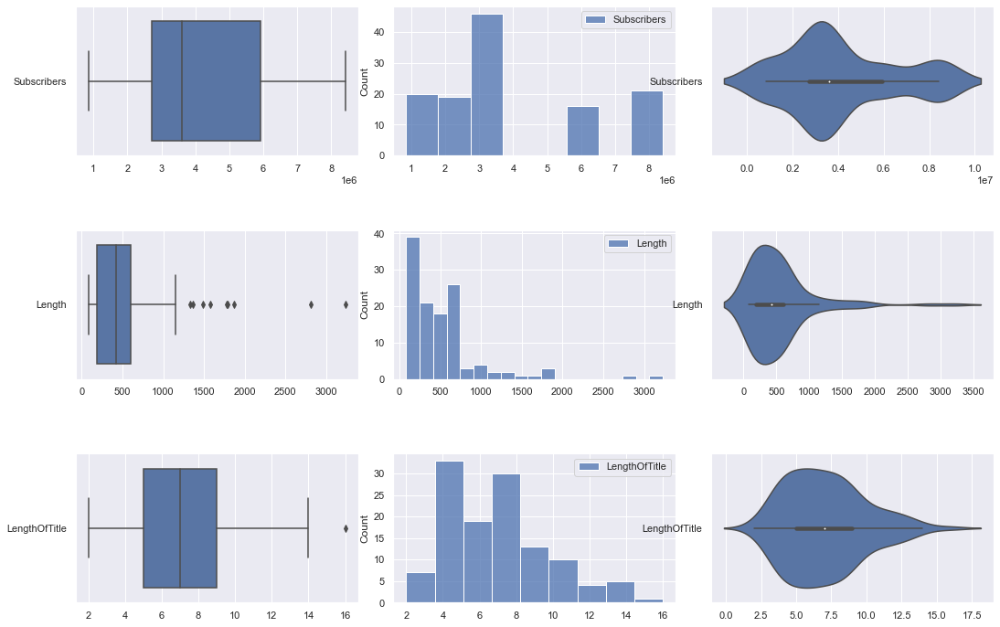


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

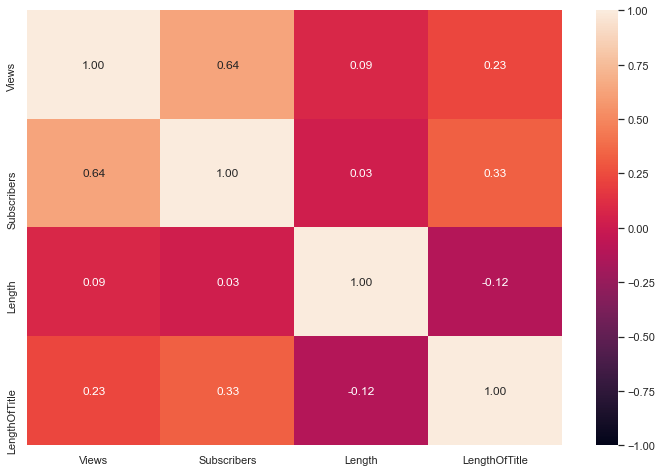

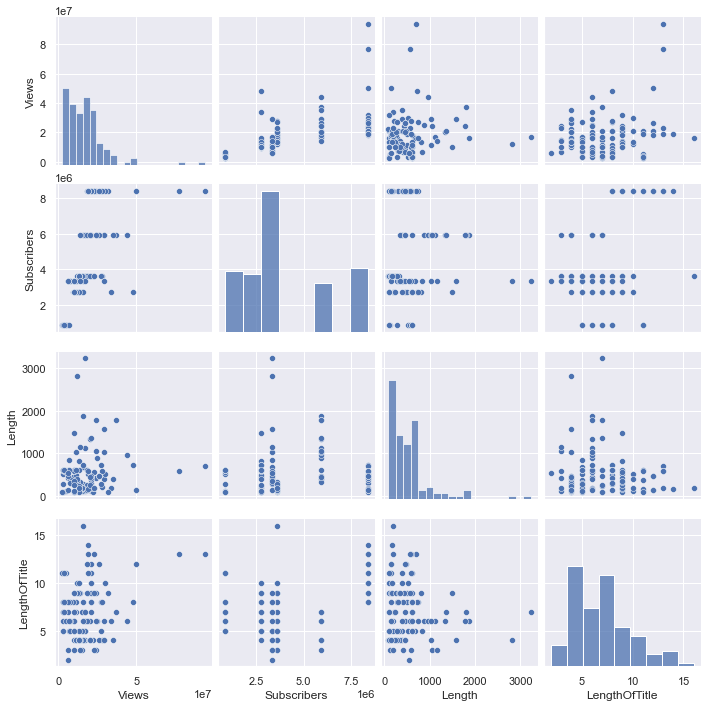


This is the Linear Regression Model based on videos that are categorised under Comedy
Intercept of Regression 	: b =  [882685.87434902]
Coefficients of Regression 	: a =  [[3.37125017e+00 1.90746370e+03 1.58406607e+05]]



<Figure size 432x288 with 0 Axes>

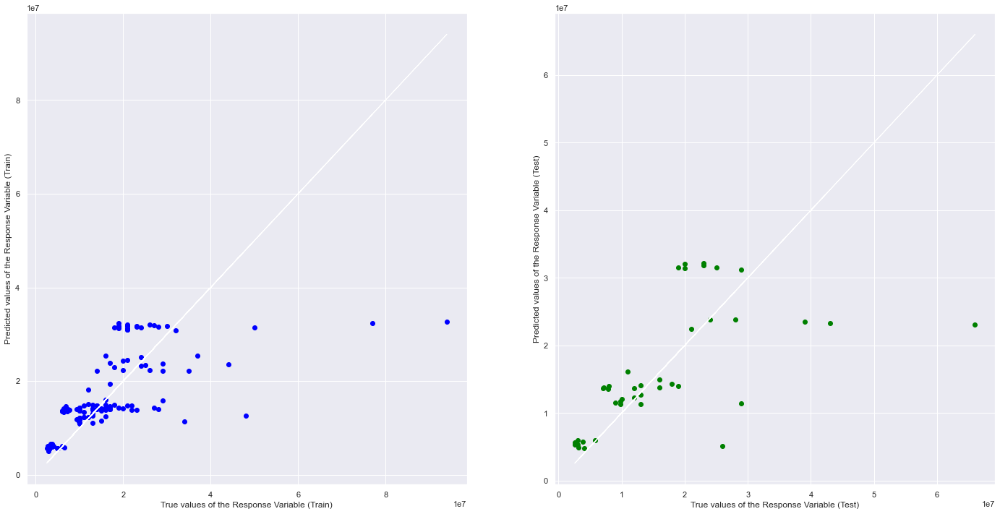


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.41016848803906336
Mean Squared Error (MSE) 	: 100301904313840.28
Root Mean Squared Error (RMSE) 	: 10015083.839581188

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3523447960537507
Mean Squared Error (MSE) 	: 101618504308086.39
Root Mean Squared Error (RMSE) 	: 10080600.394226843



In [23]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]], 63)
index += 1

#### Category: Tech

This is the Train-Test Split for the data points categorised under Tech
Train Set : (166, 1) (166, 3)
Test Set  : (56, 1) (56, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.660000e+02
mean,4.399970e+06
std,5.120942e+06
min,4.700000e+04
25%,9.370000e+05
50%,2.150000e+06
75%,7.050000e+06
max,3.300000e+07


,Subscribers,Length,LengthOfTitle
count,1.660000e+02,166.000000,166.000000
mean,4.766120e+06,827.307229,7.150602
std,5.237273e+06,1086.278678,2.643729
min,3.060000e+05,16.000000,2.000000
25%,1.090000e+06,388.000000,5.000000
50%,1.710000e+06,549.000000,7.000000
75%,5.240000e+06,879.000000,9.000000
max,1.520000e+07,9511.000000,16.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

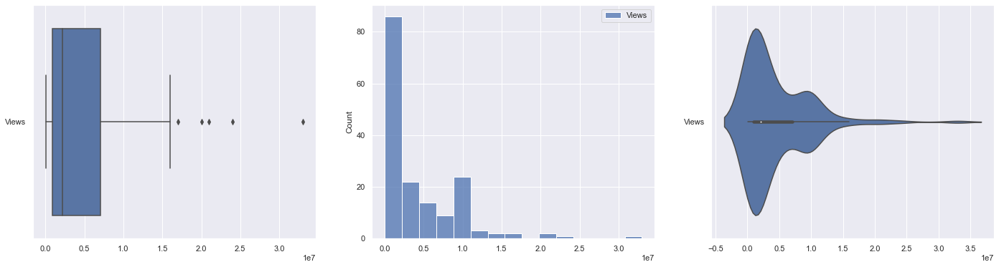


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

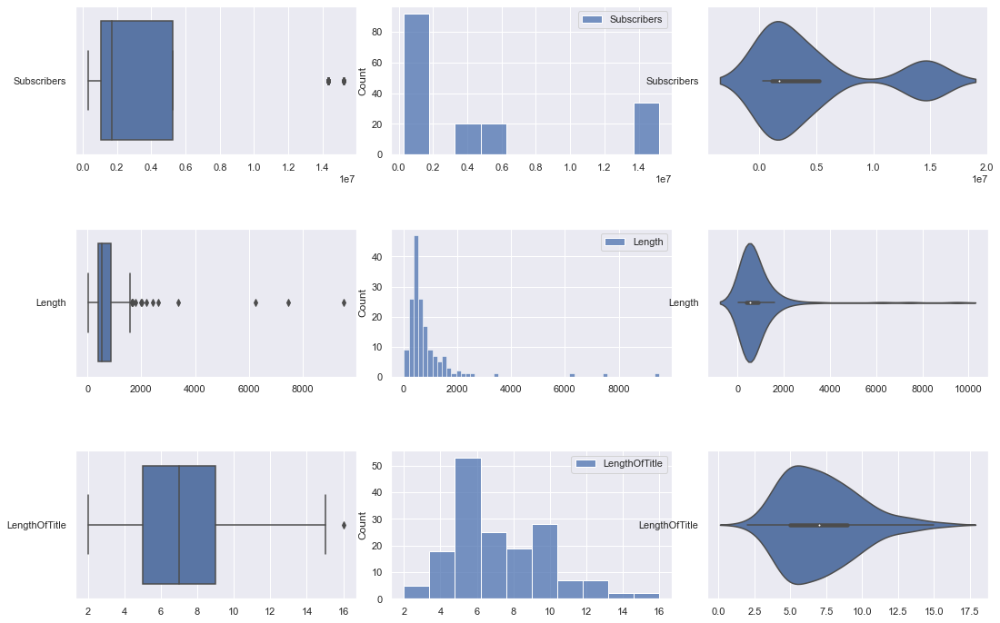


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

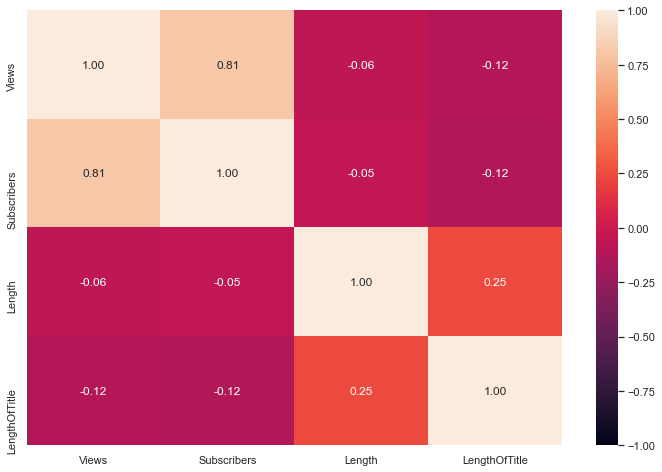

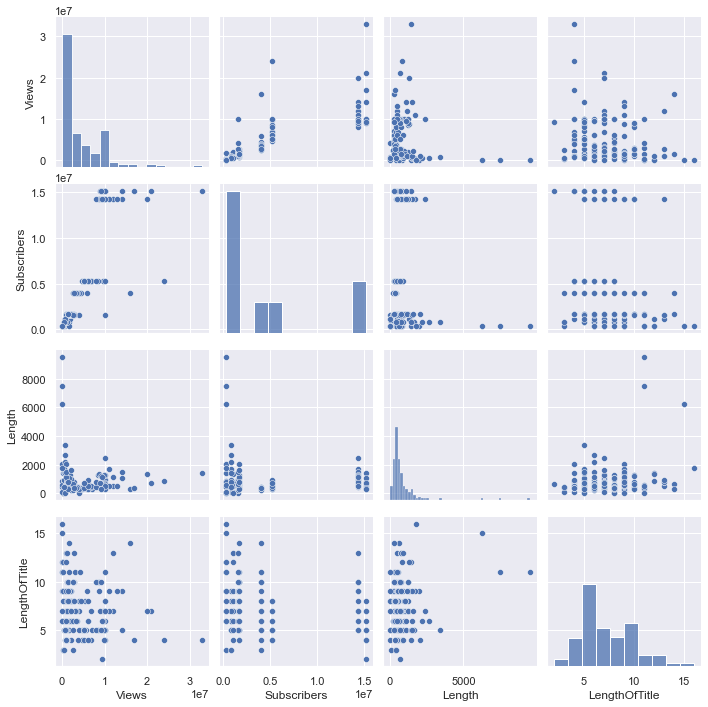


This is the Linear Regression Model based on videos that are categorised under Tech
Intercept of Regression 	: b =  [900905.12750413]
Coefficients of Regression 	: a =  [[ 7.87893629e-01 -8.94141618e+01 -2.54745296e+04]]



<Figure size 432x288 with 0 Axes>

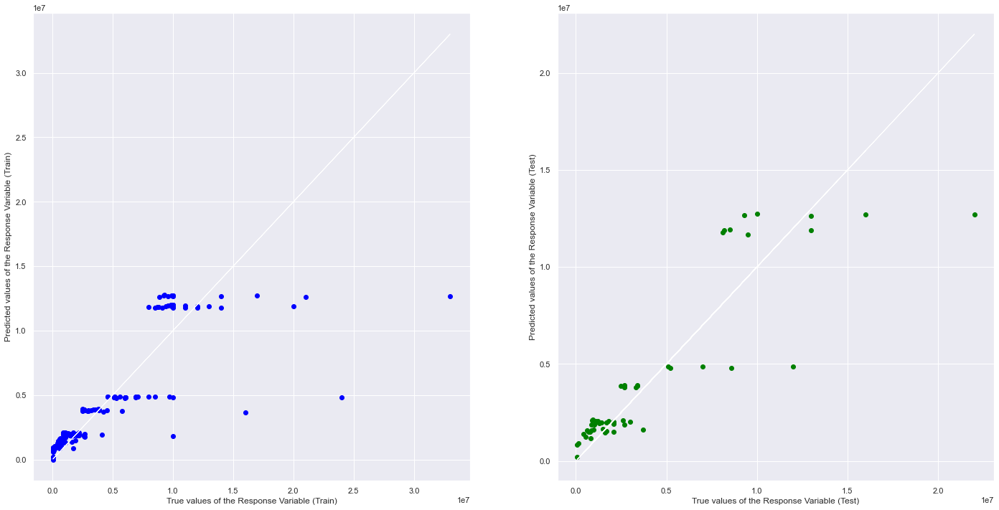


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.6540225178451977
Mean Squared Error (MSE) 	: 9018274513475.754
Root Mean Squared Error (RMSE) 	: 3003044.207712526

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7755909004197685
Mean Squared Error (MSE) 	: 4609407637461.902
Root Mean Squared Error (RMSE) 	: 2146953.1055572457



In [24]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]], 63)
index += 1

#### Category: Automobile

This is the Train-Test Split for the data points categorised under Automobile
Train Set : (172, 1) (172, 3)
Test Set  : (58, 1) (58, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.720000e+02
mean,8.544733e+06
std,8.774059e+06
min,2.730000e+05
25%,3.000000e+06
50%,5.150000e+06
75%,1.125000e+07
max,6.100000e+07


,Subscribers,Length,LengthOfTitle
count,1.720000e+02,172.000000,172.000000
mean,4.393291e+06,682.017442,9.912791
std,3.044621e+06,697.332910,3.158292
min,2.460000e+05,52.000000,4.000000
25%,1.820000e+06,286.000000,7.000000
50%,3.080000e+06,510.000000,9.000000
75%,8.240000e+06,936.500000,12.000000
max,8.690000e+06,7453.000000,20.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

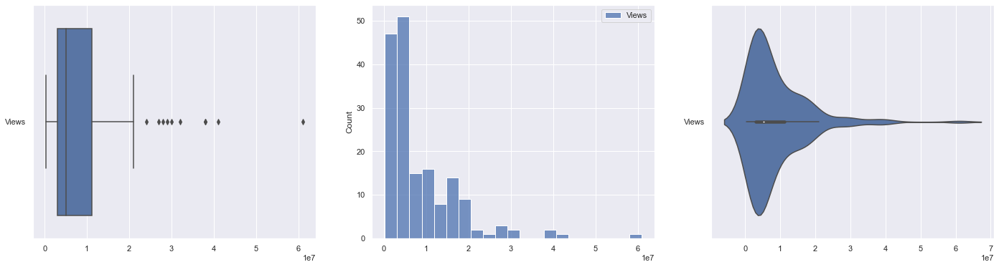


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

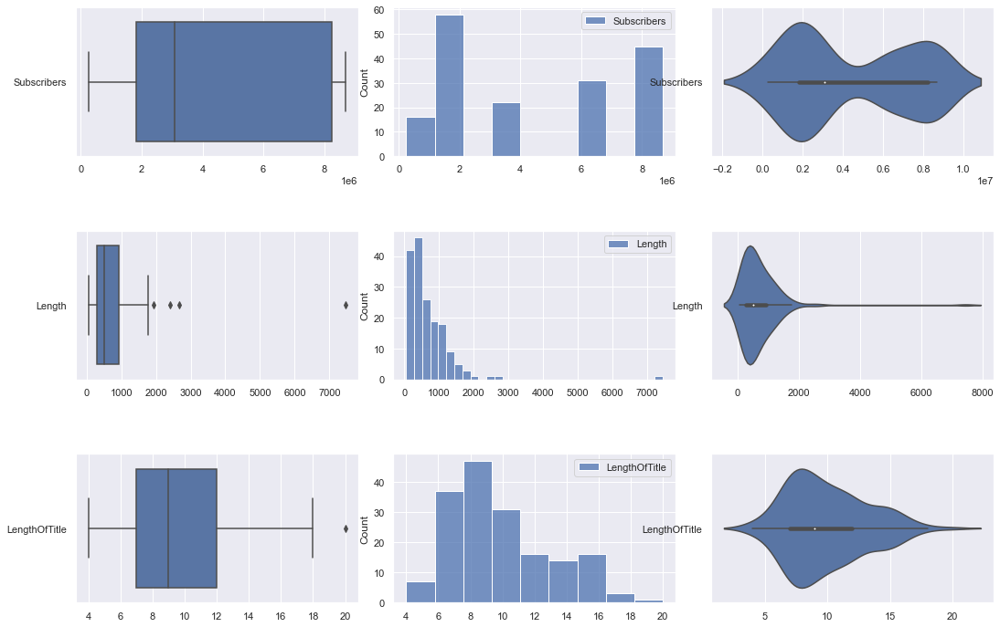


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

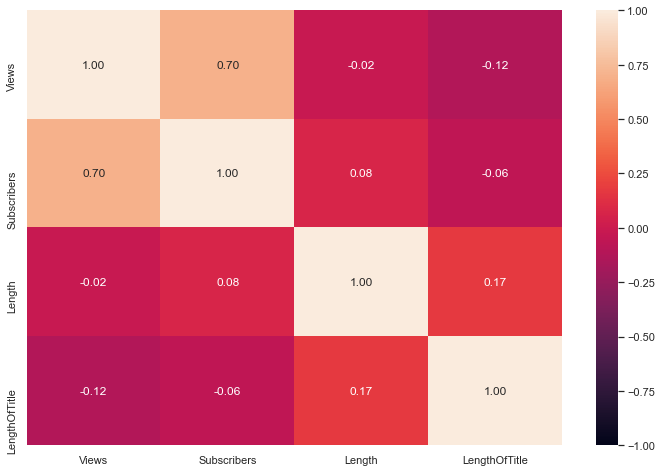

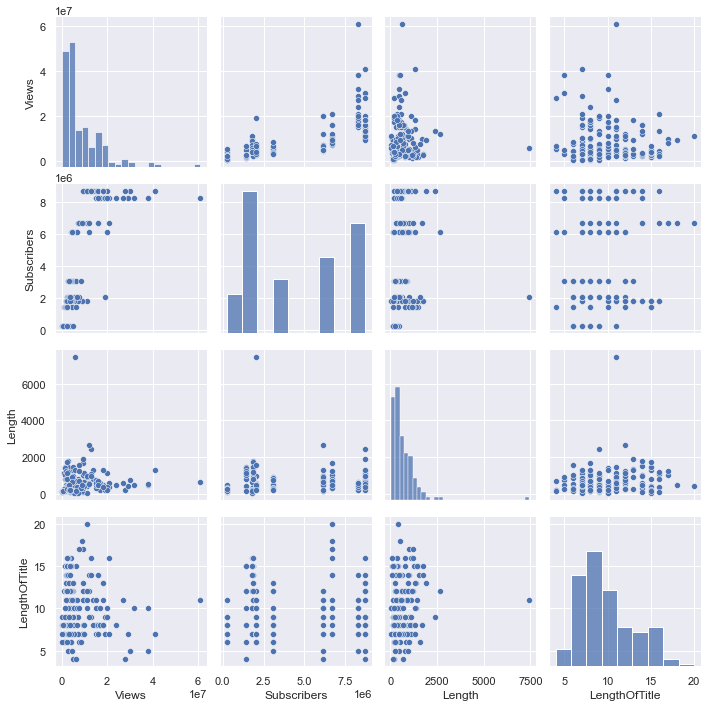


This is the Linear Regression Model based on videos that are categorised under Automobile
Intercept of Regression 	: b =  [1945199.12396642]
Coefficients of Regression 	: a =  [[ 2.02344153e+00 -7.41377560e+02 -1.80009953e+05]]



<Figure size 432x288 with 0 Axes>

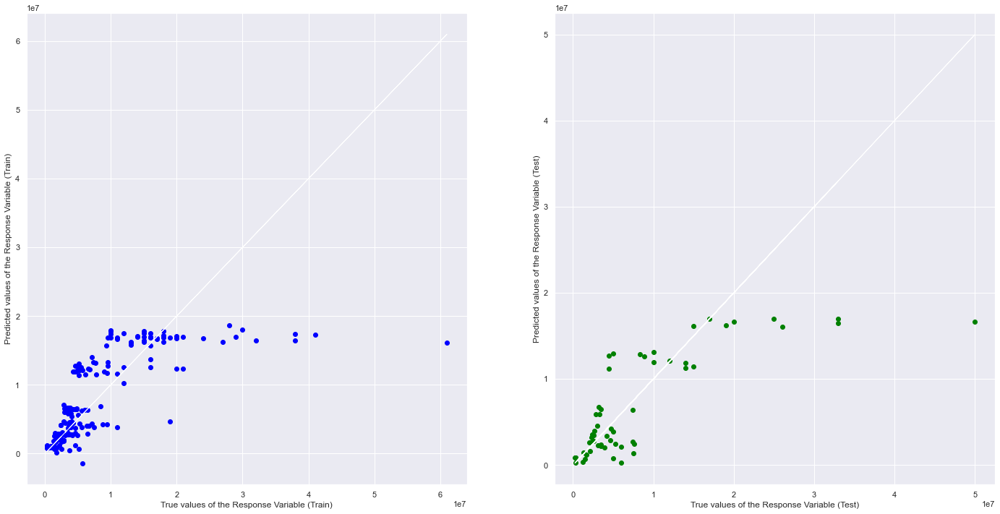


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5012429604463362
Mean Squared Error (MSE) 	: 38173128934973.4
Root Mean Squared Error (RMSE) 	: 6178440.655616383

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5558755497838201
Mean Squared Error (MSE) 	: 39560128254949.555
Root Mean Squared Error (RMSE) 	: 6289684.273073614



In [25]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]], 60)
index += 1

#### Category: Informative

This is the Train-Test Split for the data points categorised under Informative
Train Set : (144, 1) (144, 3)
Test Set  : (48, 1) (48, 3)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.440000e+02
mean,8.945382e+06
std,7.646174e+06
min,8.350000e+05
25%,4.500000e+06
50%,8.300000e+06
75%,1.000000e+07
max,5.700000e+07


,Subscribers,Length,LengthOfTitle
count,1.440000e+02,144.000000,144.000000
mean,5.188750e+06,893.784722,6.729167
std,3.574805e+06,1810.121319,2.763951
min,1.000000e+06,47.000000,2.000000
25%,2.290000e+06,342.000000,5.000000
50%,3.380000e+06,482.000000,6.000000
75%,1.030000e+07,739.000000,9.000000
max,1.130000e+07,19280.000000,15.000000



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

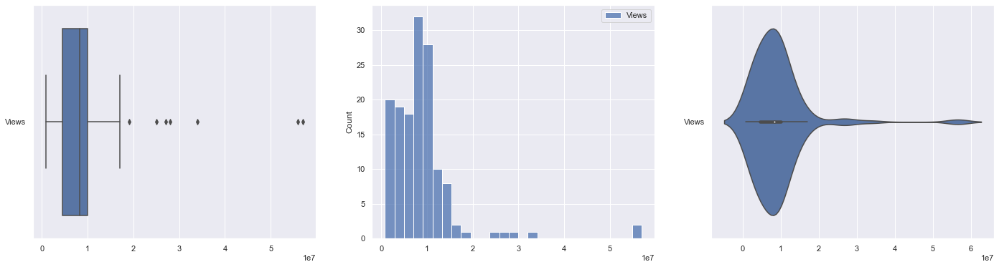


Below plots the Boxplot, Histogram, and Violinplot of the following variables (in order): 
(1) Subscribers
(2) Released
(3) Length
(4) LengthOfTitle


<Figure size 432x288 with 0 Axes>

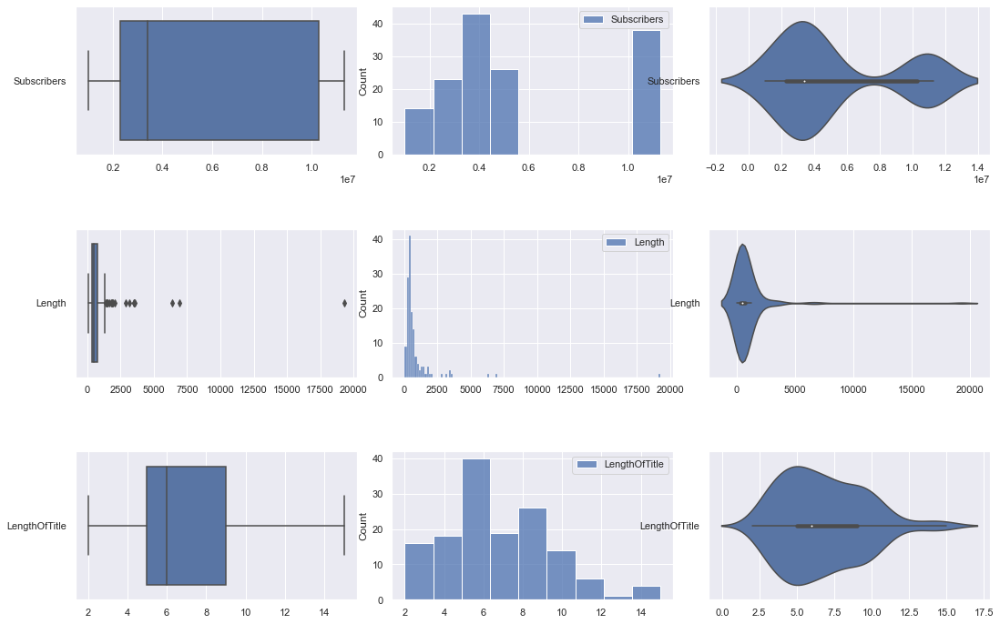


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

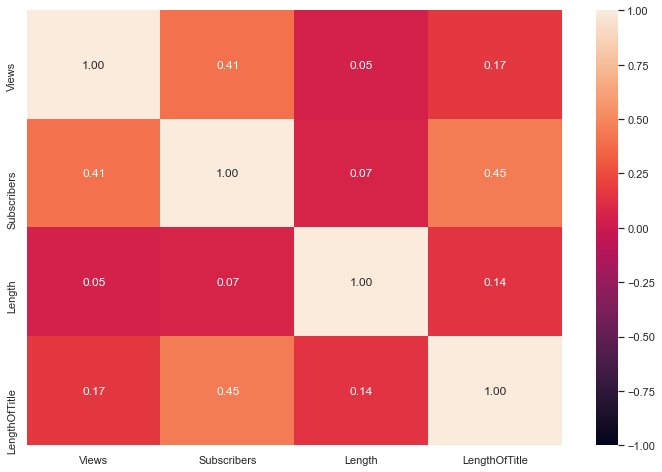

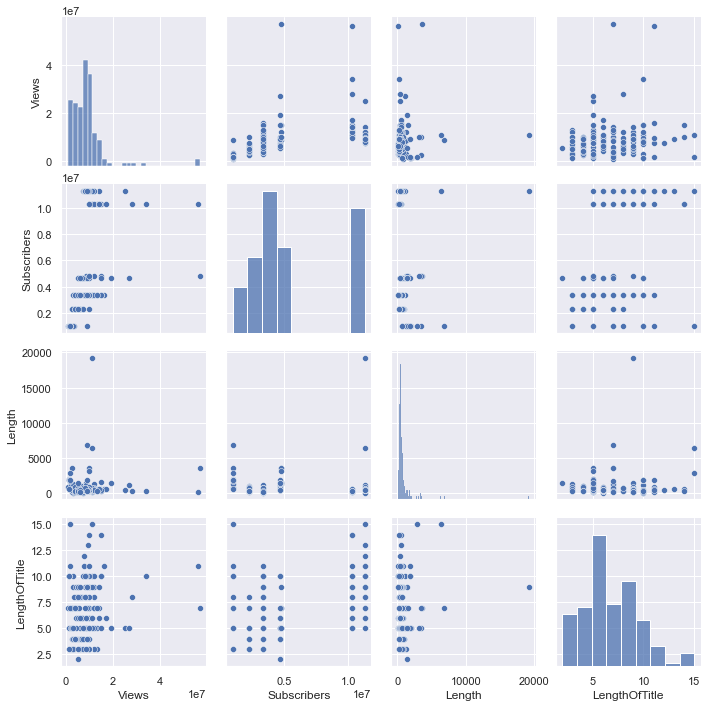


This is the Linear Regression Model based on videos that are categorised under Informative
Intercept of Regression 	: b =  [4717857.08018531]
Coefficients of Regression 	: a =  [[ 8.87625004e-01  1.21305111e+02 -7.23061354e+04]]



<Figure size 432x288 with 0 Axes>

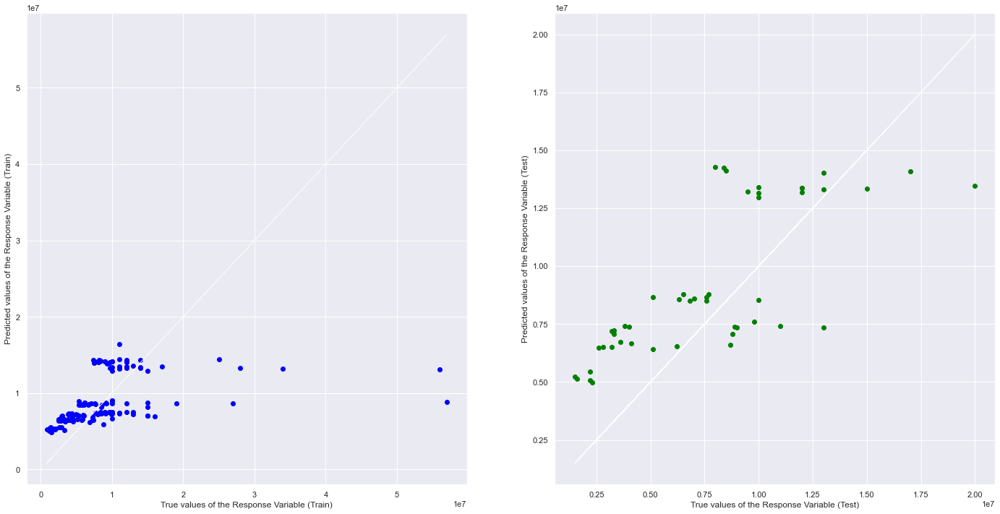


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.16532102276691274
Mean Squared Error (MSE) 	: 48459766877724.14
Root Mean Squared Error (RMSE) 	: 6961304.969452505

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.4284635366057674
Mean Squared Error (MSE) 	: 10128816916850.986
Root Mean Squared Error (RMSE) 	: 3182580.229444497



In [26]:
m.LRFuncByCat(categoryList[index], catDict[categoryList[index]])
index += 1

**Analysis**: After passing our data through the Linear Regression Models, we observed that our models were effective in predicting the response variable for specified **Categories**, namely: Blog, Food, Entertainment, Science, Tech, and Automobile. However, it is not as effective in predicting the response variable for the remaining **Categories**. To further establish the relationship of our predictors and response, we will pass our data through other Machine Learning Models.

### Machine Learning Model: Decision Tree Classification Model

We will be using **Keywords within Title of Video** as a response in this model. As seen from the intial provided data set, it is not provided in the data set. We will be deriving this data from Title ourselves and including it into the dataframe.

The intent here is to determine if there is a relationship between **Views** and having certain **Keywords within Title of Video**. This is to augment the advertisers and marketing firms ability to advise the channel they are investing in to include crucial keywords in their videos.

#### Category: Blog

This is the first 5 entries of the dataframe generated for the category Blog


,Title,Views
0,Former CIA Agent Breaks Down Jeffrey Epstein Case,7900000
9,The Roswell Incident,2200000
10,The Hard Truth About FouseyTube,5500000
22,Japan's Most Expensive Beef | Wagyu,4700000
29,why I moved to new york city,534000


,Word,Occurrence
0,dramaalert,27
1,joe,24
2,rogan,23
3,paul,20
4,japan,19
5,japanes,14
6,jake,12
7,old,11
8,000,11
9,tri,9


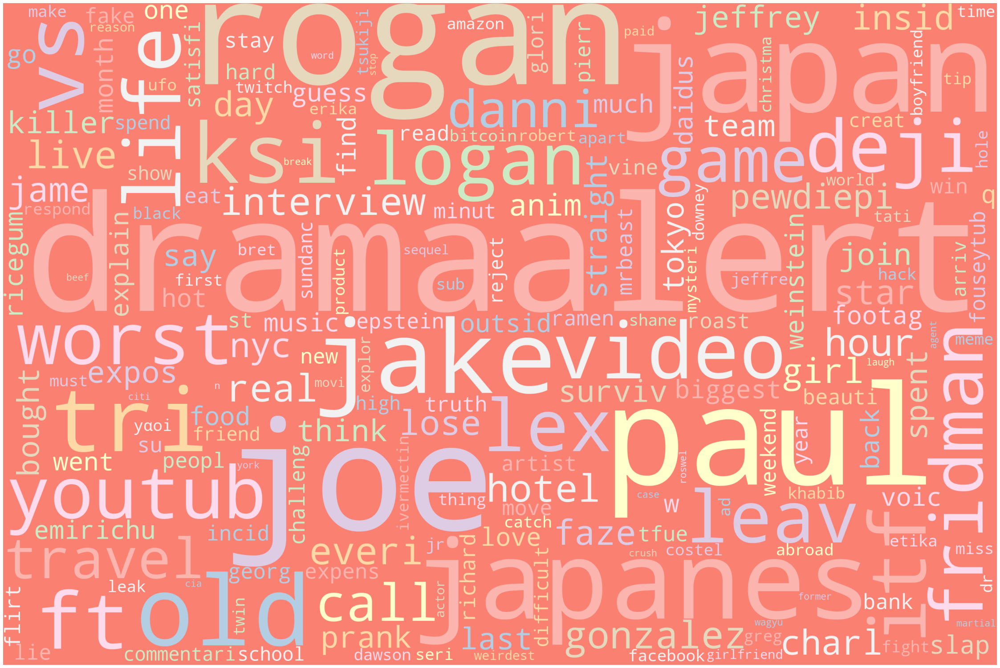

In [27]:
index = 0
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Blog
Train Set : (164, 1) (164, 1)
Test Set  : (41, 1) (41, 1)

This is the swarmplot of Views Train against hasTop20 Train.


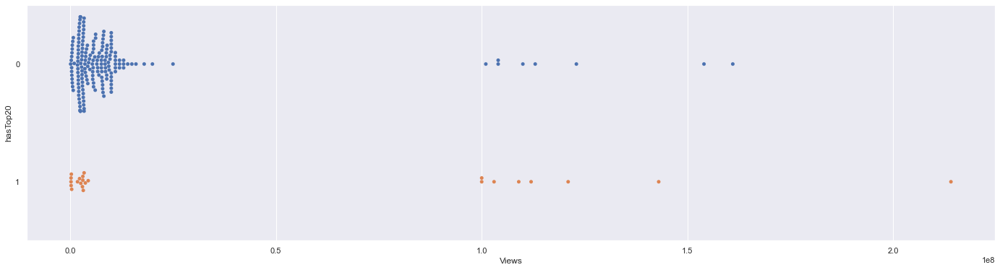


This is the decision tree after training.


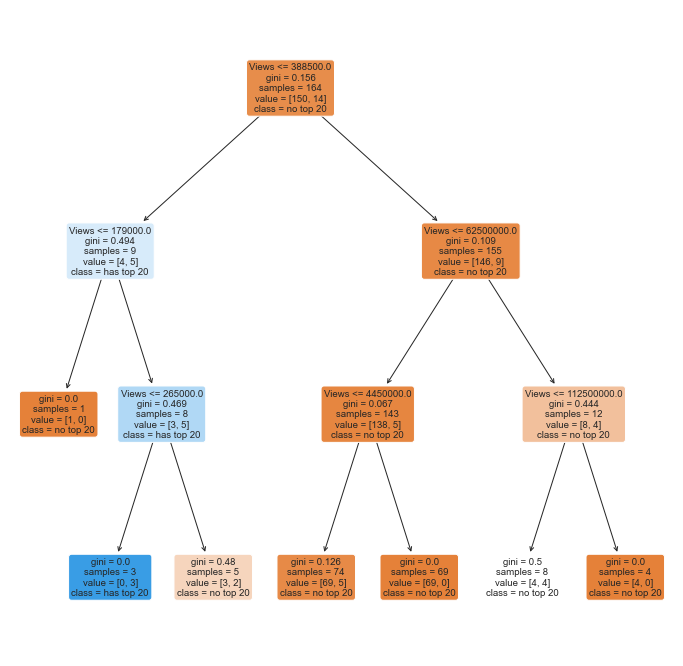

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9329268292682927
False Negative Rate		: 0.7857142857142857
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.21428571428571427

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7804878048780488
False Negative Rate		: 1.0
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

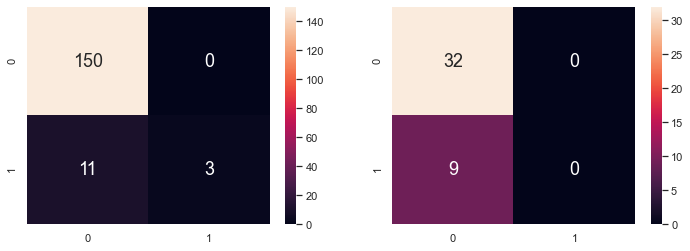

In [28]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: Food

This is the first 5 entries of the dataframe generated for the category Food


,Title,Views
2,The Iconic $1 Pizza Slice of NYC | Street Food...,11000000
11,How To Slice Every Fruit | Method Mastery | Ep...,38000000
24,James May shocks electricians with vegan hot d...,590000
30,Every Way to Cook a Potato (63 Methods) | Bon ...,9600000
48,Gordon Ramsay Being Served The Worst Fish Dish...,27000000


,Word,Occurrence
0,make,64
1,gordon,57
2,ramsay,49
3,chef,46
4,food,38
5,gourmet,36
6,hot,31
7,bon,30
8,foxi,29
9,game,29


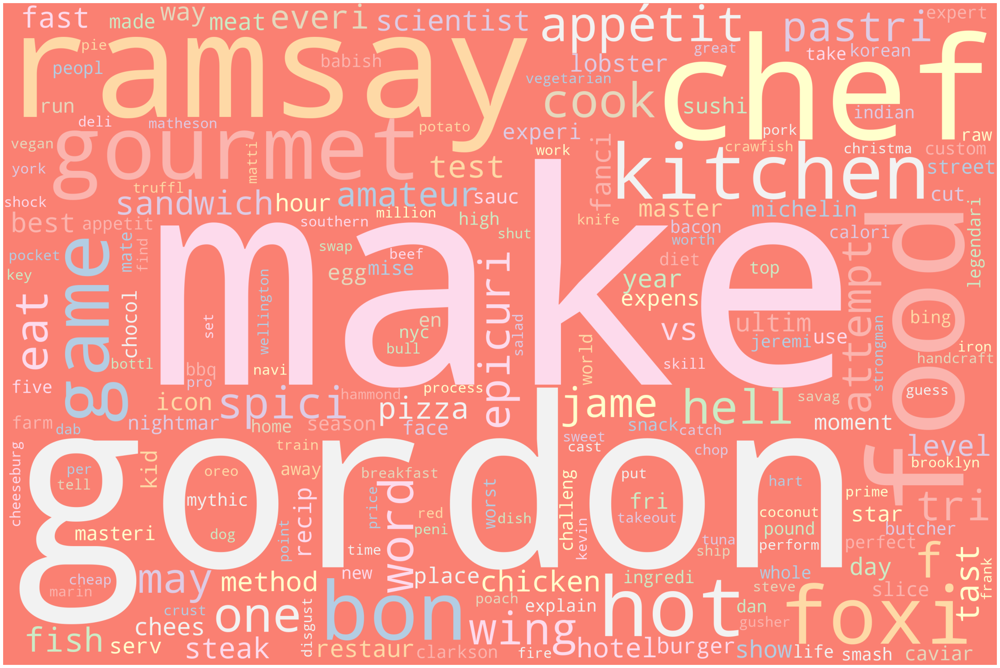

In [29]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Food
Train Set : (204, 1) (204, 1)
Test Set  : (52, 1) (52, 1)

This is the swarmplot of Views Train against hasTop20 Train.


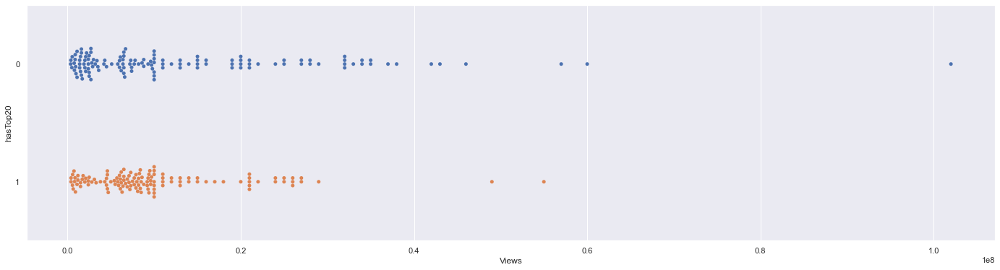


This is the decision tree after training.


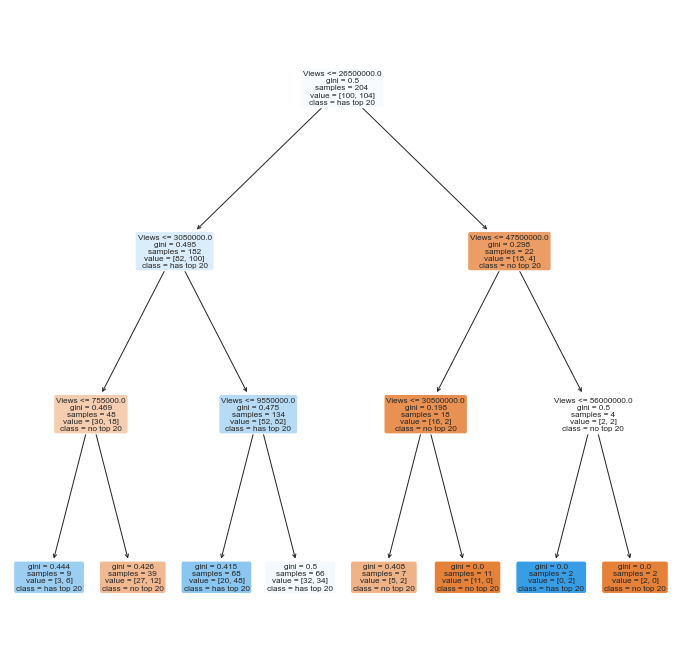

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6617647058823529
False Negative Rate		: 0.1346153846153846
True Negative Rate		: 0.45

False Positive Rate		: 0.55
True Positive Rate		: 0.8653846153846154

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5384615384615384
False Negative Rate		: 0.23809523809523808
True Negative Rate		: 0.3870967741935484

False Positive Rate		: 0.6129032258064516
True Positive Rate		: 0.7619047619047619


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

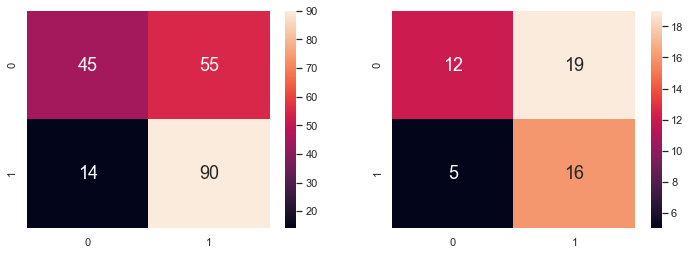

In [30]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category Entertainment

This is the first 5 entries of the dataframe generated for the category Entertainment


,Title,Views
3,Ron Swanson: The Papa of Pawnee | Parks and Re...,2300000
5,The Doctor Defeats the Abzorbaloff | Love and ...,8500000
53,Celebrities Impersonating Other Celebrities - ...,23000000
71,Honest Trailers - Suicide Squad,12000000
123,The Doctor In The White House | The Impossible...,3600000


,Word,Occurrence
0,doctor,47
1,tri,32
2,park,30
3,honest,29
4,trailer,29
5,recreat,28
6,show,28
7,graham,26
8,guy,26
9,norton,25


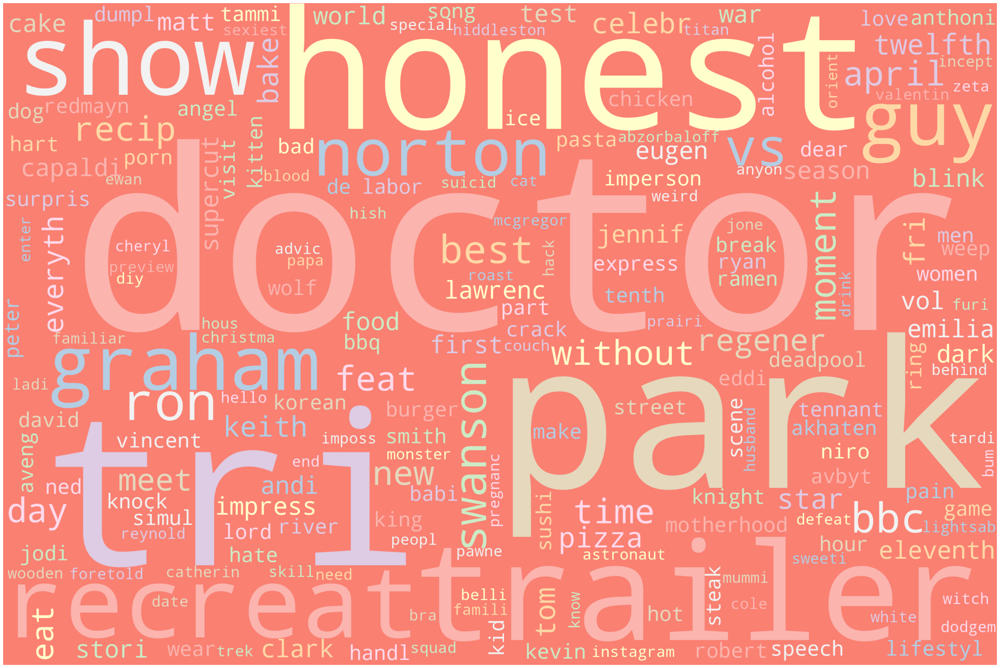

In [31]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Entertainment
Train Set : (133, 1) (133, 1)
Test Set  : (34, 1) (34, 1)

This is the swarmplot of Views Train against hasTop20 Train.


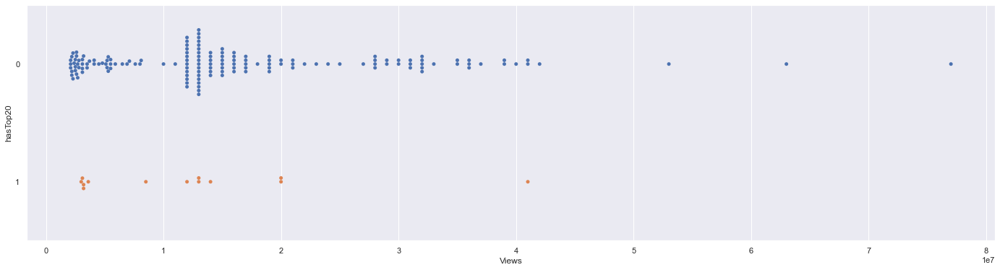


This is the decision tree after training.


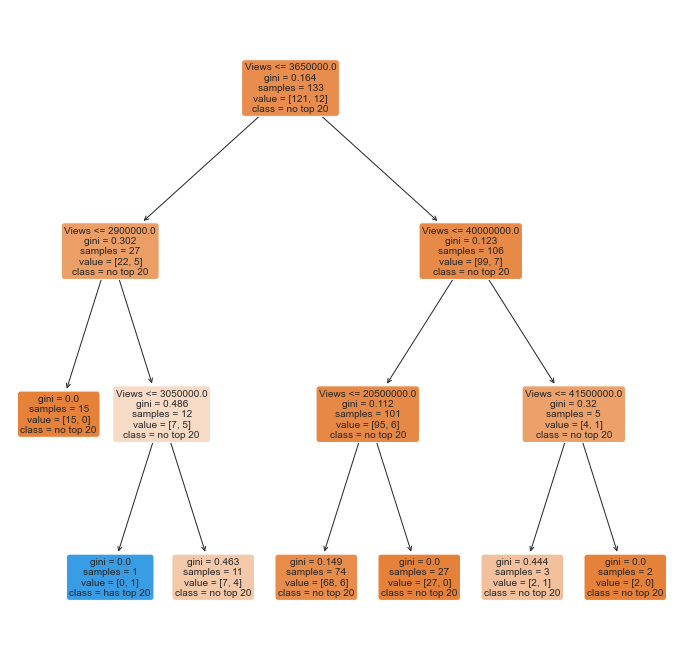

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9172932330827067
False Negative Rate		: 0.9166666666666666
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.08333333333333333

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9705882352941176
False Negative Rate		: 1.0
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

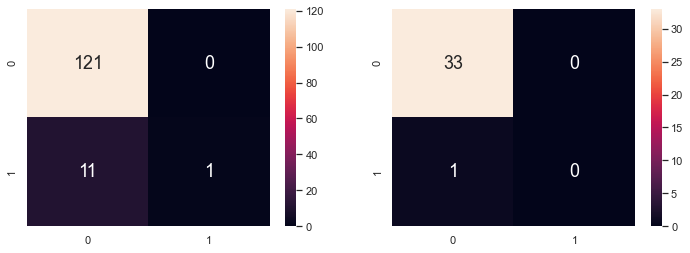

In [32]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: Science

This is the first 5 entries of the dataframe generated for the category Science


,Title,Views
4,What's The Most Dangerous Place on Earth?,21000000
13,Extracting Lidocaine from Anal Lubricant,3800000
33,How to Escape from a Car Window (SLOW MOTION) ...,10000000
43,The Immune System Explained I – Bacteria Infec...,38000000
65,Which Way Is Down?,24000000


,Word,Occurrence
0,everi,26
1,day,26
2,smarter,25
3,time,24
4,space,23
5,make,21
6,world,19
7,univers,14
8,pbs,14
9,digit,14


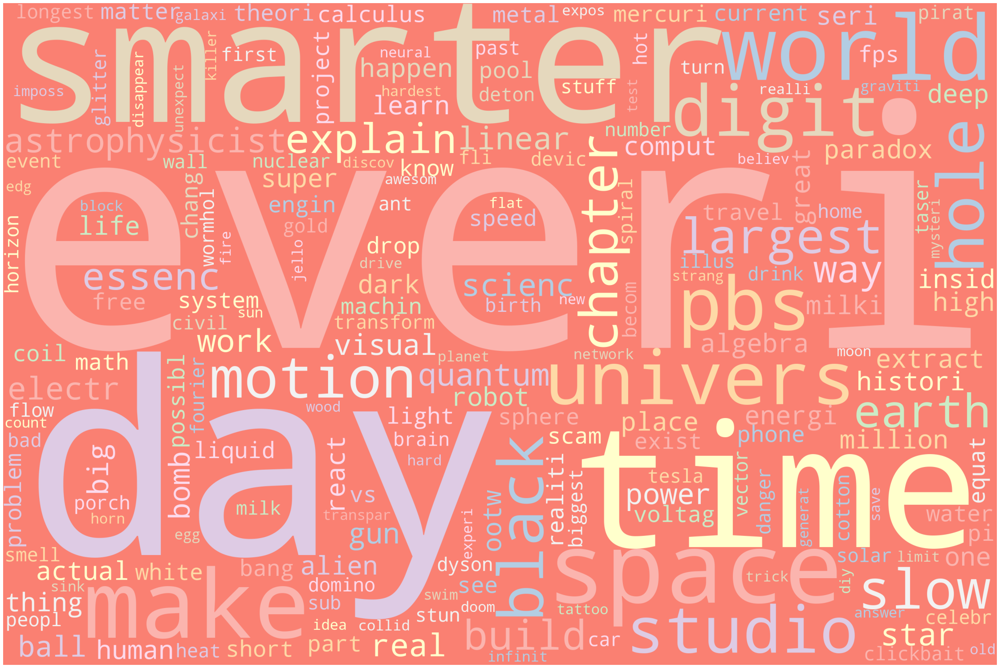

In [33]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Science
Train Set : (219, 1) (219, 1)
Test Set  : (55, 1) (55, 1)

This is the swarmplot of Views Train against hasTop20 Train.


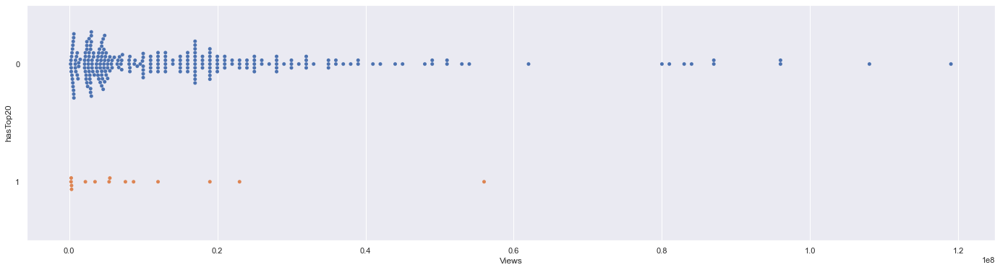


This is the decision tree after training.


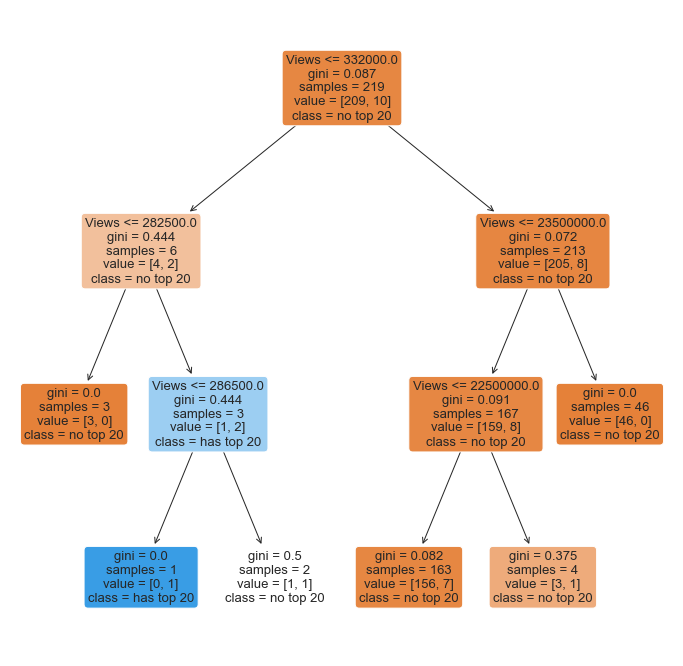

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.958904109589041
False Negative Rate		: 0.9
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.1

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9272727272727272
False Negative Rate		: 1.0
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

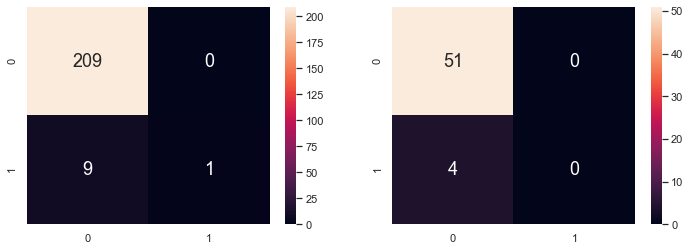

In [34]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: News

This is the first 5 entries of the dataframe generated for the category News


,Title,Views
6,Live PD: Most Viewed Moments from Walton Count...,14000000
8,We Decoded The Nuclear Weapons At North Korea'...,583000
32,Sex addiction: Five times a day 'wasn't enough...,20000000
37,How Racist Is Boston? | The Daily Show,7200000
45,Exclusive: Full Interview With Russian Preside...,8199999


,Word,Occurrence
0,news,46
1,bbc,26
2,e,20
3,show,20
4,nbc,19
5,daili,18
6,live,15
7,moment,15
8,pd,14
9,trump,13


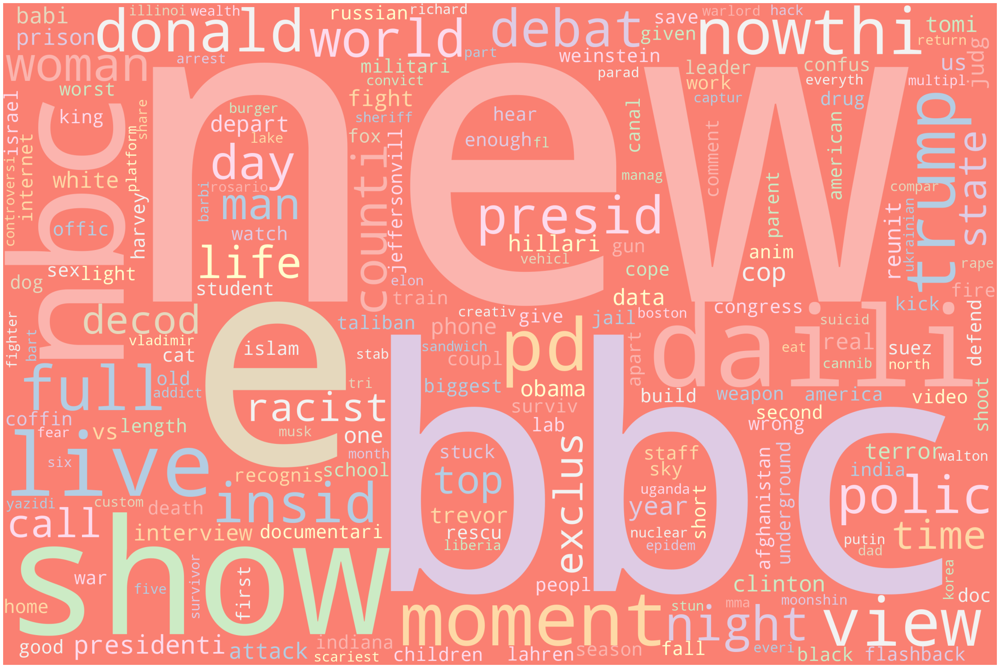

In [35]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under News
Train Set : (112, 1) (112, 1)
Test Set  : (28, 1) (28, 1)

This is the swarmplot of Views Train against hasTop20 Train.


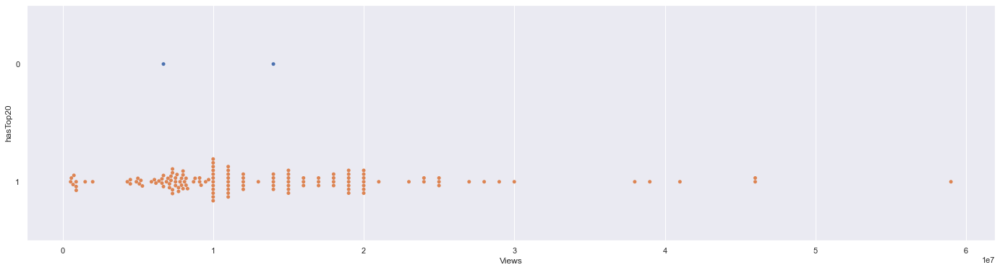


This is the decision tree after training.


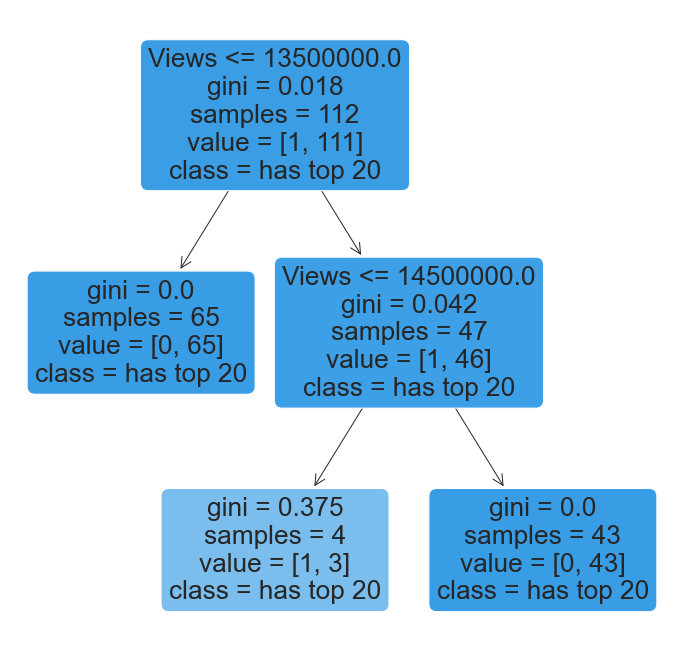

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9910714285714286
False Negative Rate		: 0.0
True Negative Rate		: 0.0

False Positive Rate		: 1.0
True Positive Rate		: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9642857142857143
False Negative Rate		: 0.0
True Negative Rate		: 0.0

False Positive Rate		: 1.0
True Positive Rate		: 1.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

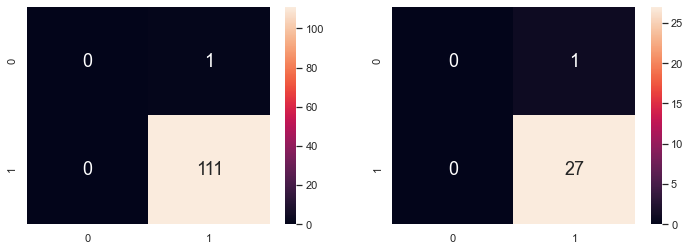

In [36]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: VideoGames

This is the first 5 entries of the dataframe generated for the category VideoGames


,Title,Views
7,Bloodborne with ENB - 016 - Eileen End - Iosef...,502000
21,CS:GO Pistols Tutorial,4000000
50,I Turned Valheim Into a Physics-Defying Nightmare,9100000
54,Battlefield 4 Best Guns For All Classes,2600000
83,LGR - PC Turbo Buttons,1700000


,Word,Occurrence
0,4,23
1,game,23
2,1,23
3,10,21
4,lgr,20
5,freddi,20
6,part,19
7,night,19
8,five,18
9,3,17


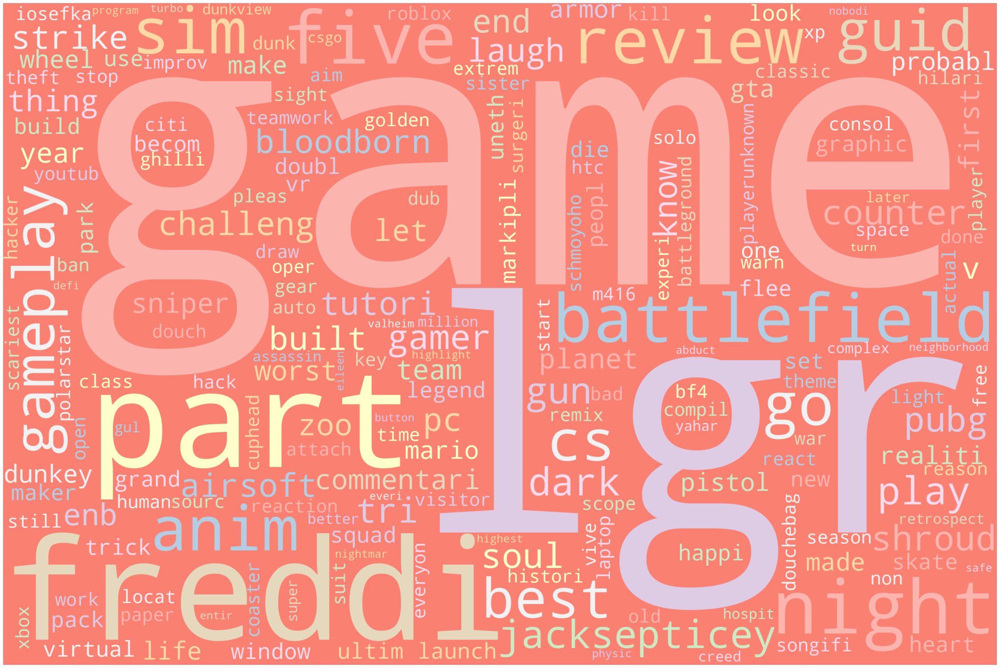

In [37]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under VideoGames
Train Set : (190, 1) (190, 1)
Test Set  : (48, 1) (48, 1)

This is the swarmplot of Views Train against hasTop20 Train.


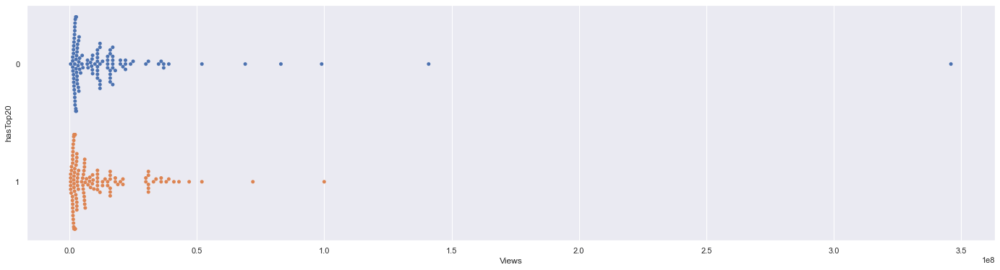


This is the decision tree after training.


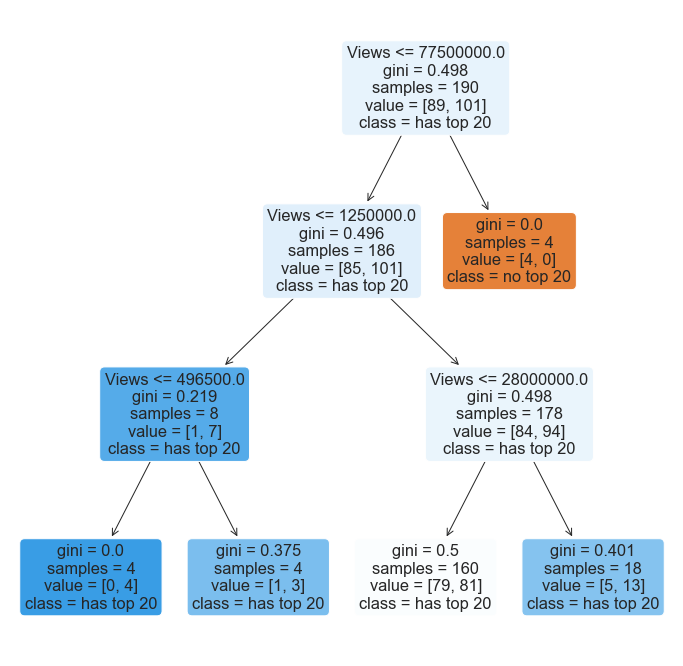

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5526315789473685
False Negative Rate		: 0.0
True Negative Rate		: 0.0449438202247191

False Positive Rate		: 0.9550561797752809
True Positive Rate		: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.4375
False Negative Rate		: 0.045454545454545456
True Negative Rate		: 0.0

False Positive Rate		: 1.0
True Positive Rate		: 0.9545454545454546


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

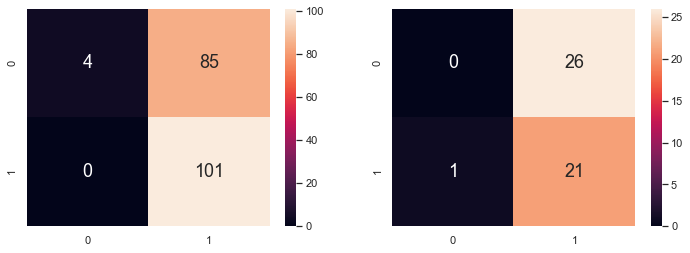

In [38]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: Comedy

This is the first 5 entries of the dataframe generated for the category Comedy


,Title,Views
12,Jake & Amy Feels (Vol 1) | Brooklyn Nine-Nine,3300000
18,Hitler - OverSimplified (Part 1),29000000
60,Introducing The Squad | Brooklyn Nine-Nine,3200000
97,"""American Sniper"" Chris Kyle Interview | CONAN...",21000000
163,"Melissa Rauch's Accidental ""Big Bang Theory"" M...",18000000


,Word,Occurrence
0,nine,58
1,conan,47
2,key,30
3,peel,30
4,brooklyn,29
5,tbs,28
6,offic,28
7,us,27
8,oversimplifi,19
9,part,16


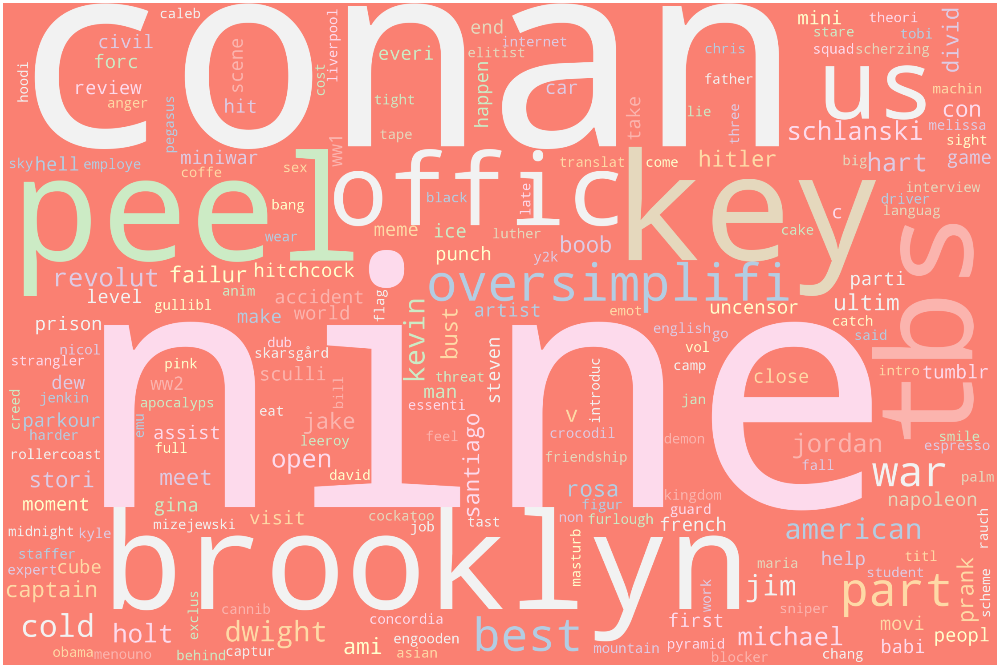

In [39]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Comedy
Train Set : (130, 1) (130, 1)
Test Set  : (33, 1) (33, 1)

This is the swarmplot of Views Train against hasTop20 Train.


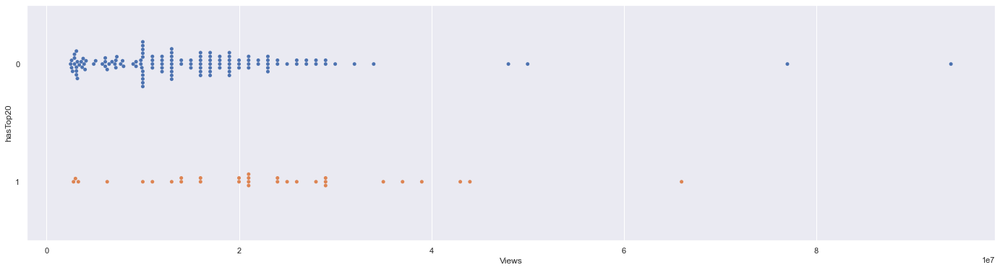


This is the decision tree after training.


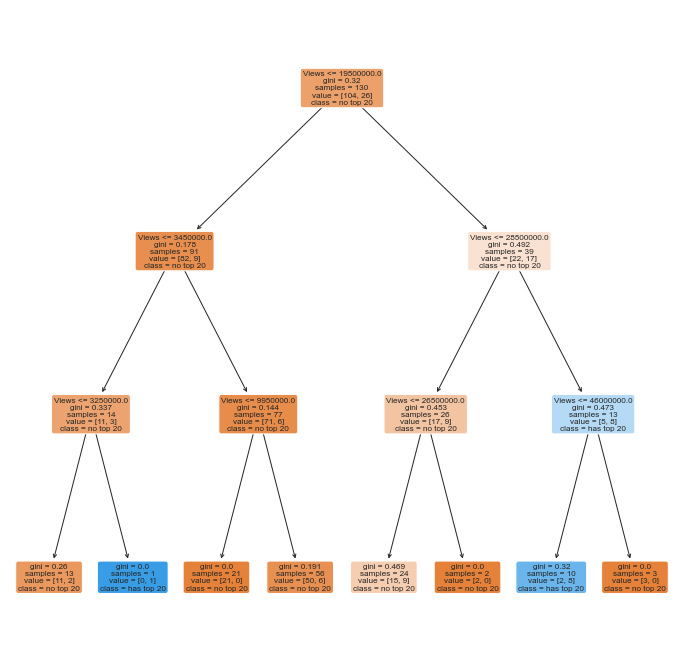

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8538461538461538
False Negative Rate		: 0.6538461538461539
True Negative Rate		: 0.9807692307692307

False Positive Rate		: 0.019230769230769232
True Positive Rate		: 0.34615384615384615

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7272727272727273
False Negative Rate		: 1.0
True Negative Rate		: 0.8571428571428571

False Positive Rate		: 0.14285714285714285
True Positive Rate		: 0.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

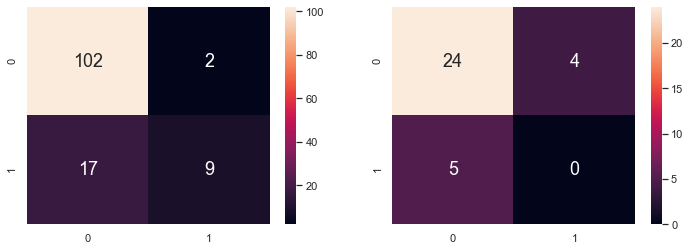

In [40]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: Tech

This is the first 5 entries of the dataframe generated for the category Tech


,Title,Views
16,The Ultimate PlayStation Comparison,6000000
23,Does High FPS make you a better gamer? Ft. Shr...,9500000
25,SteelSeries Arctis 5 - the BEST $99 Gaming Hea...,1400000
26,8 Must Know JavaScript Array Methods,667000
35,This Will Kill Your Computer,9700000


,Word,Occurrence
0,game,27
1,build,19
2,pc,17
3,vs,14
4,code,13
5,learn,13
6,javascript,12
7,fast,11
8,minut,11
9,possibl,10


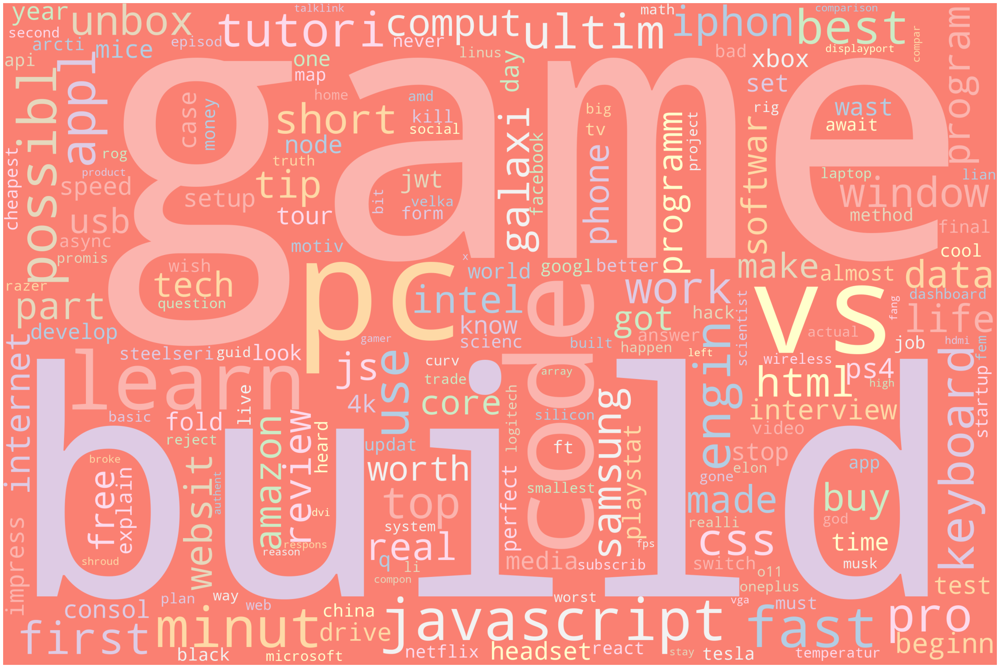

In [41]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Tech
Train Set : (177, 1) (177, 1)
Test Set  : (45, 1) (45, 1)

This is the swarmplot of Views Train against hasTop20 Train.


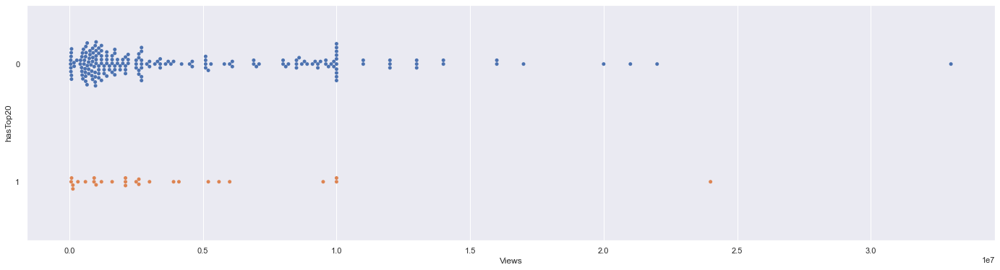


This is the decision tree after training.


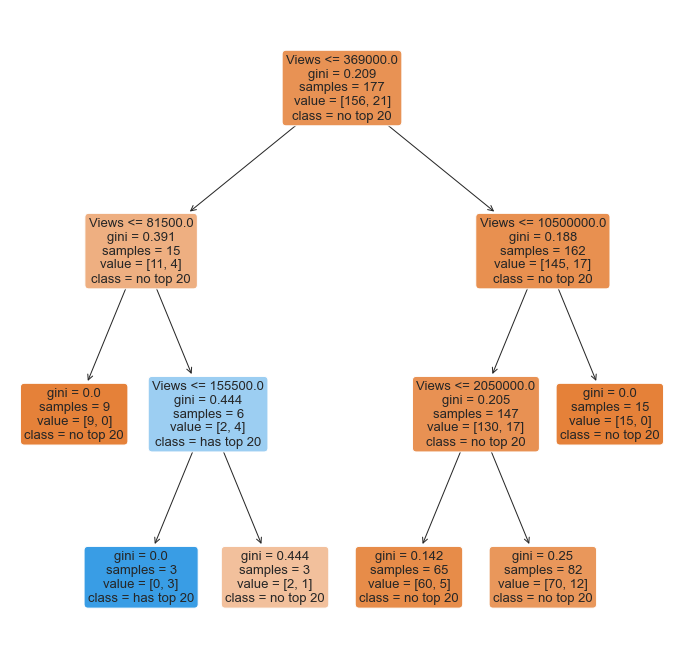

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8983050847457628
False Negative Rate		: 0.8571428571428571
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.14285714285714285

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8666666666666667
False Negative Rate		: 1.0
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

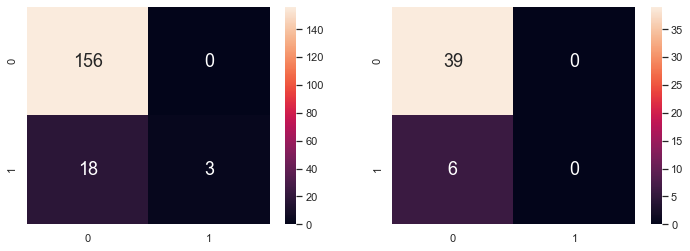

In [42]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: Automobile

This is the first 5 entries of the dataframe generated for the category Automobile


,Title,Views
19,James May explains the time he nearly killed J...,4700000
39,Truck Driving Challenge Part 1: Rig Stig & Pow...,15000000
46,"Jeremy Clarkson, Richard Hammond and James May...",6500000
58,Botswana Adventure Part 1 - Top Gear - BBC,17000000
61,2021 Mercedes-Maybach GLS600 vs Rolls-Royce Cu...,3900000


,Word,Occurrence
0,vs,67
1,top,54
2,gear,53
3,car,53
4,race,36
5,v,30
6,stig,29
7,bbc,28
8,drag,26
9,review,25


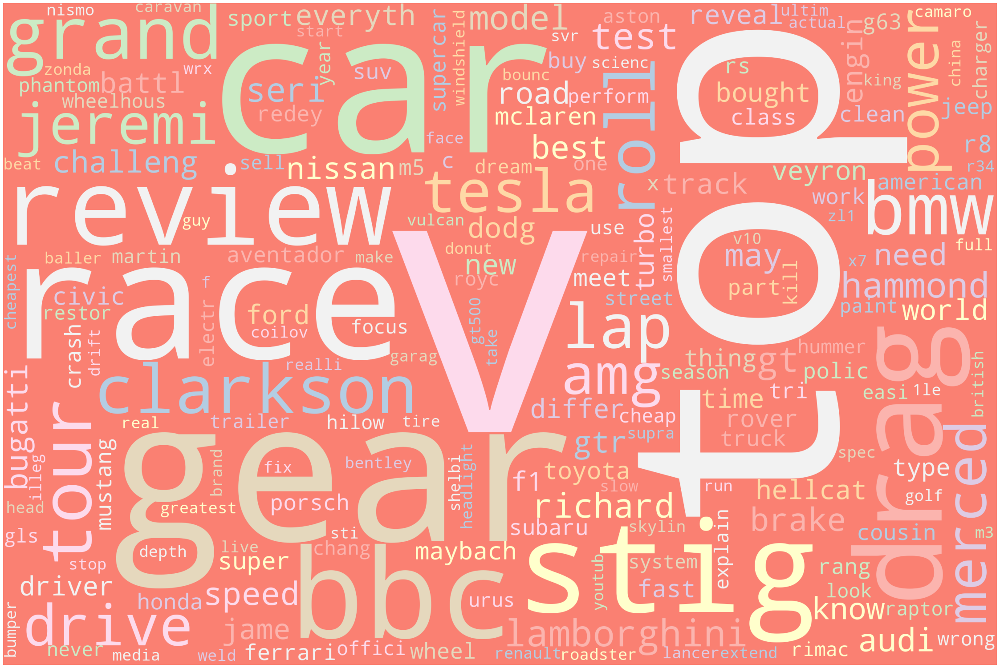

In [43]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Automobile
Train Set : (184, 1) (184, 1)
Test Set  : (46, 1) (46, 1)

This is the swarmplot of Views Train against hasTop20 Train.


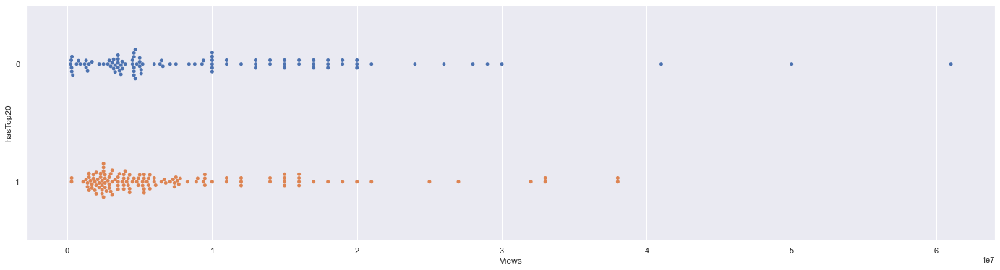


This is the decision tree after training.


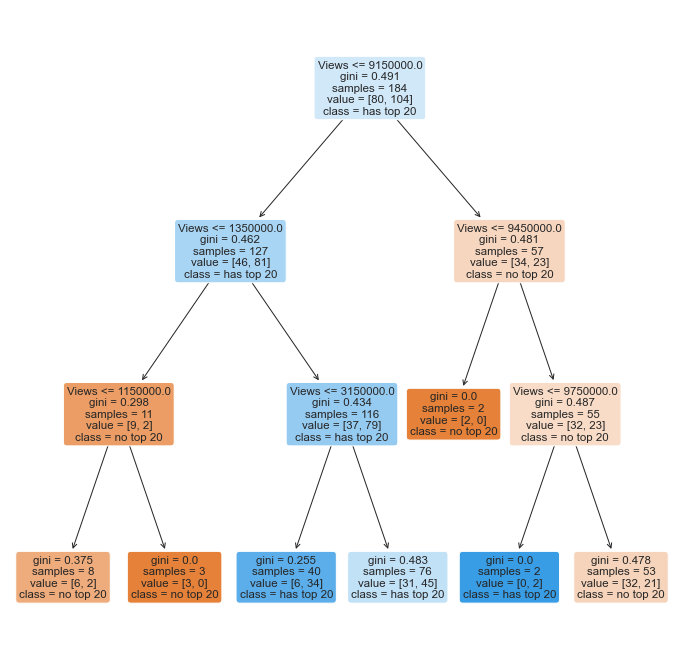

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6739130434782609
False Negative Rate		: 0.22115384615384615
True Negative Rate		: 0.5375

False Positive Rate		: 0.4625
True Positive Rate		: 0.7788461538461539

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5652173913043478
False Negative Rate		: 0.38461538461538464
True Negative Rate		: 0.5

False Positive Rate		: 0.5
True Positive Rate		: 0.6153846153846154


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

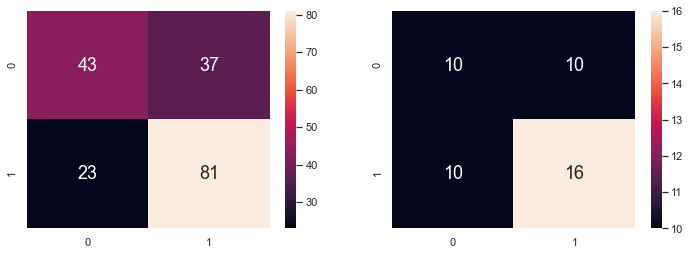

In [44]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

#### Category: Informative

This is the first 5 entries of the dataframe generated for the category Informative


,Title,Views
27,Captain D's Definitive Guide to TRICK SHOTS,6900000
38,What Is The Deadliest Substance On Earth? Toxi...,9000000
49,Top 10 Facts - Humans,5400000
56,Dog Breed Deformities,13000000
74,Top 10 Facts - Undertale,6200000


,Word,Occurrence
0,top,20
1,10,20
2,fact,18
3,quick,12
4,debunk,10
5,mysteri,10
6,case,8
7,world,7
8,vs,7
9,histori,7


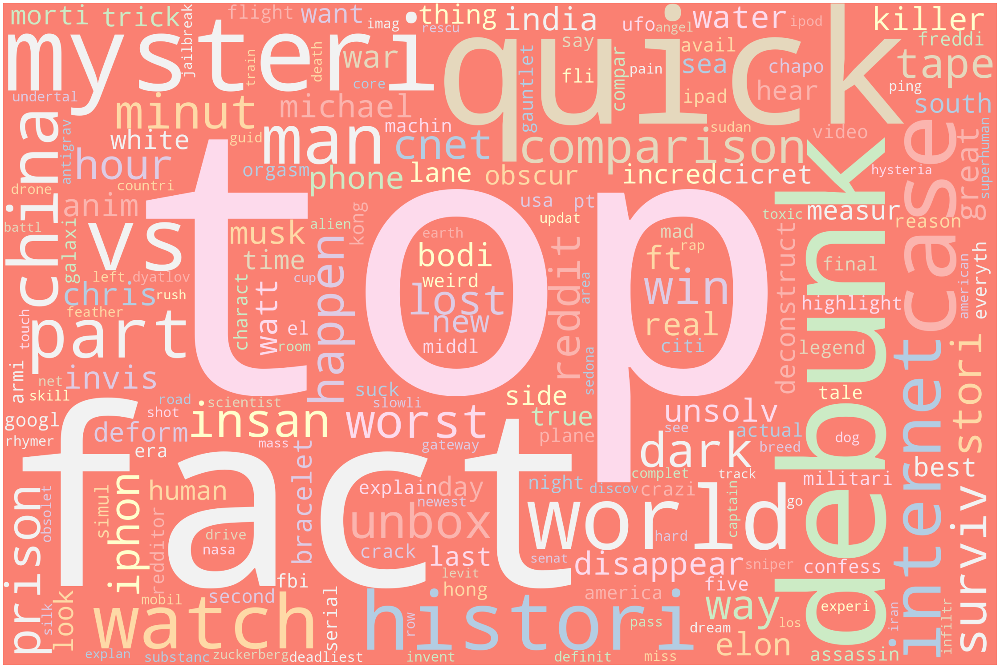

In [45]:
topWords = m.generateTopWords(categoryList[index], catDict[categoryList[index]], 20)

This is the Train-Test Split for the data points categorised under Informative
Train Set : (153, 1) (153, 1)
Test Set  : (39, 1) (39, 1)

This is the swarmplot of Views Train against hasTop20 Train.


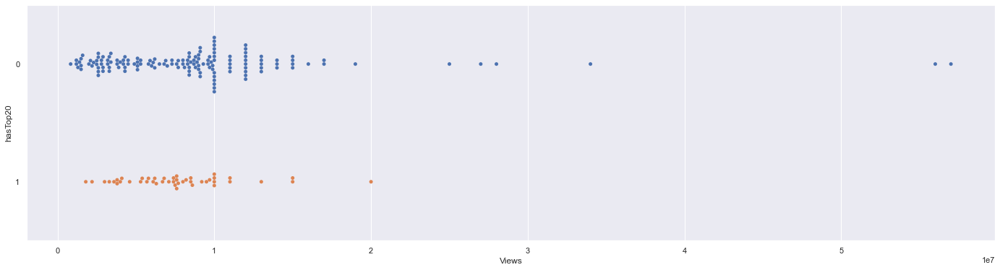


This is the decision tree after training.


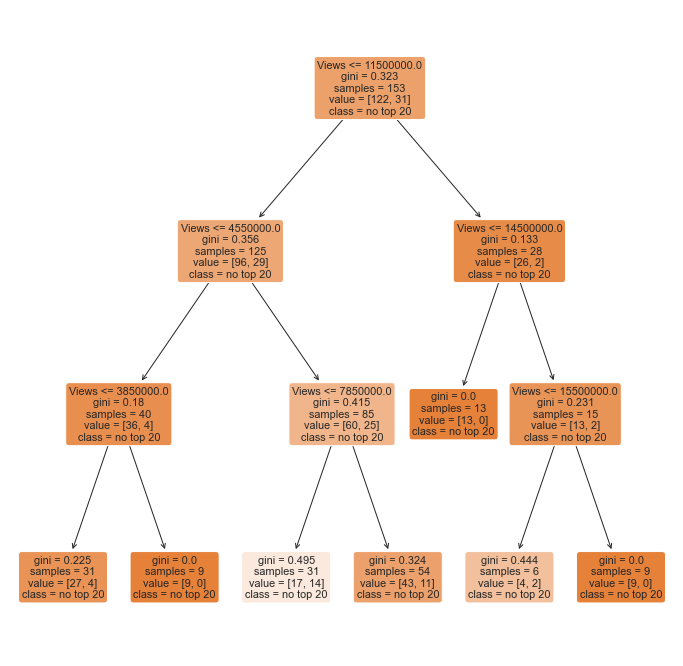

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7973856209150327
False Negative Rate		: 1.0
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6410256410256411
False Negative Rate		: 1.0
True Negative Rate		: 1.0

False Positive Rate		: 0.0
True Positive Rate		: 0.0


This is the corresponding Confusion Matrix for both Train and Test.
Train is on the left. Test is on the right.


<Figure size 432x288 with 0 Axes>

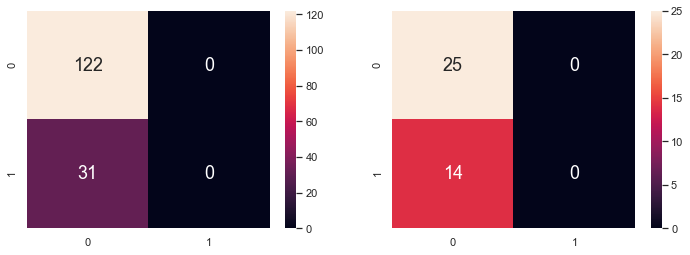

In [46]:
m.DTFunc(categoryList[index], catDict[categoryList[index]], topWords)
index += 1

**Analysis**: Upon observation of our Decision Tree Classification Model, we noticed that the majority of the **Categories** have a high Classification Accuracy of at least 90%. However, looking at the associated calculations within the model, it exhibited signs of overfitting. This implies that that the model may be unreliable in providing us positive insights on the relationship.

### Machine Learning Model: Linear Regression (In General)

From our first series of Linear Regression Models that were done for the various **Categories**, we noticed that **Subscribers** generally had the highest correlation with **Views** amongst the different predictors. While we are aware that correlation does not imply causality, we wanted to have a deeper analysis on the effects of **Subscribers** on **Views**. Hence, we will be conducting a uni-variate approach towards the next Linear Regression Model to ascertain our hypothesis.

This is the Train-Test Split for the dataset:
Train Set : (1669, 1) (1669, 1)
Test Set  : (418, 1) (418, 1)

This is the Summary Statistics of our Train Dataset:


,Views
count,1.669000e+03
mean,1.241285e+07
std,1.846283e+07
min,5.100000e+04
25%,2.900000e+06
50%,7.900000e+06
75%,1.500000e+07
max,3.460000e+08


,Subscribers
count,1.669000e+03
mean,6.920587e+06
std,9.552527e+06
min,1.790000e+05
25%,1.820000e+06
50%,4.010000e+06
75%,8.410000e+06
max,8.970000e+07



Below plots the Boxplot, Histogram, and Violinplot of Views


<Figure size 432x288 with 0 Axes>

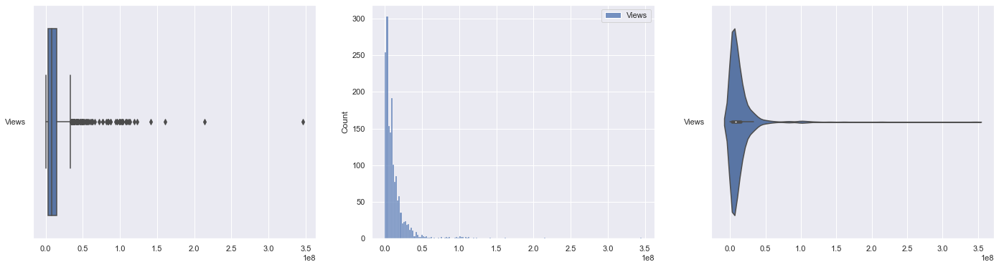


Below plots the Boxplot, Histogram, and Violinplot of Subscribers


<Figure size 432x288 with 0 Axes>

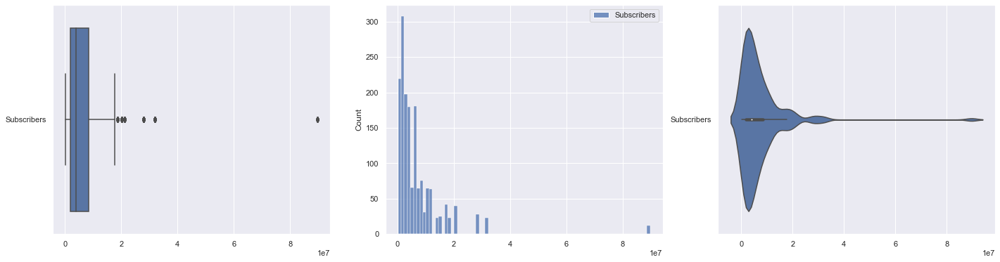


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

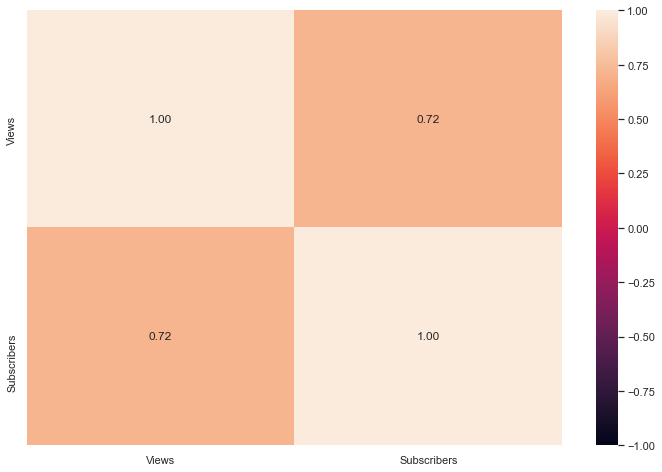

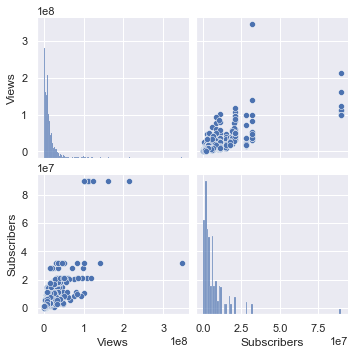


This is the Linear Regression Model predicting Views based on Subsribers in general
Intercept of Regression 	: b =  [2821322.31019175]
Coefficients of Regression 	: a =  [[1.38594178]]



<Figure size 432x288 with 0 Axes>

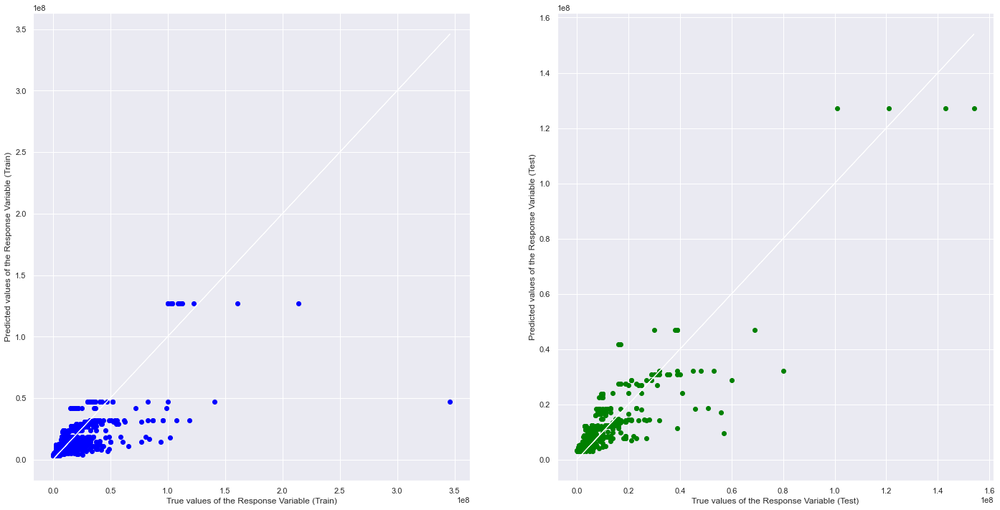


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5141977876010975
Mean Squared Error (MSE) 	: 165499053026214.53
Root Mean Squared Error (RMSE) 	: 12864643.525034595

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7712323907739476
Mean Squared Error (MSE) 	: 60557283913683.16
Root Mean Squared Error (RMSE) 	: 7781856.071252099



In [47]:
m.LRFuncInGen(cleanDF, "Subscribers", "Views", 42)

**Analysis**: From the model above, we noticed that indeed **Subscribers** has a postive effect on **Views**.

As observed from the above Linear Regression Model, the R^2 value of the Train dataset is significantly lower than that of the Test dataset. We acknowledged that a potential limiting factor was that there are multiple videos published by the same YouTuber, and these videos would amass different levels of viewership.

Therefore, to further enhance our model, we decided to take the **Average Views per Channel** and analyse its relationship with **Subscribers**.

In [48]:
channelList = []
for channel in cleanDF['Channel'].unique():
    channelList.append(channel)

newData = {}
index = 0
for channel in channelList:
    totalViews = 0
    count = 0
    for i in range(len(cleanDF)):
        if cleanDF['Channel'].iloc[i] == channel:
            count += 1
            totalViews += cleanDF['Views'].iloc[i]
            newData[index] = [channel, cleanDF['Category'].iloc[i], cleanDF['Subscribers'].iloc[i], count, totalViews]
            
    newData[index].append(totalViews / count)
    index += 1
    
byChannel = pd.DataFrame(newData)
byChannel = byChannel.T
byChannel.columns = ['Channel', 'Category', 'Subscribers', 'Count', 'Total Views', 'Average Views per Channel']
byChannel.head()

,Channel,Category,Subscribers,Count,Total Views,Average Views per Channel
0,JRE Clips,Blog,6280000,25,251199999,10047999.96
1,Munchies,Food,4590000,27,242000000,8962962.962963
2,Parks and Recreation,Entertainment,282000,28,85899999,3067857.107143
3,Vsauce,Science,17400000,26,599000000,23038461.538462
4,Doctor Who,Entertainment,1590000,26,151399999,5823076.884615


This is the Train-Test Split for the dataset:
Train Set : (72, 1) (72, 1)
Test Set  : (18, 1) (18, 1)

This is the Summary Statistics of our Train Dataset:


,Average Views per Channel
count,72.0
unique,72.0
top,13200000.0
freq,1.0


,Subscribers
count,72
unique,71
top,1590000
freq,2



Below plots the Boxplot, Histogram, and Violinplot of Average Views per Channel


<Figure size 432x288 with 0 Axes>

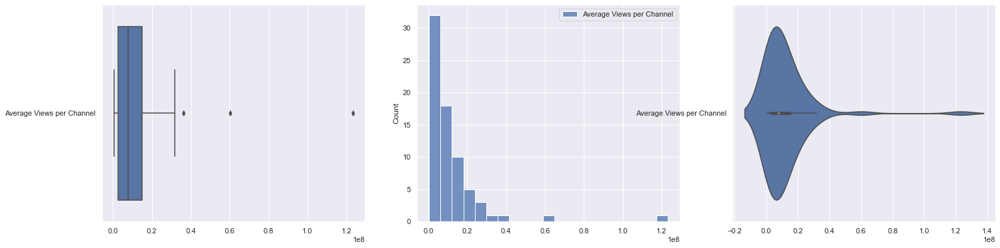


Below plots the Boxplot, Histogram, and Violinplot of Subscribers


<Figure size 432x288 with 0 Axes>

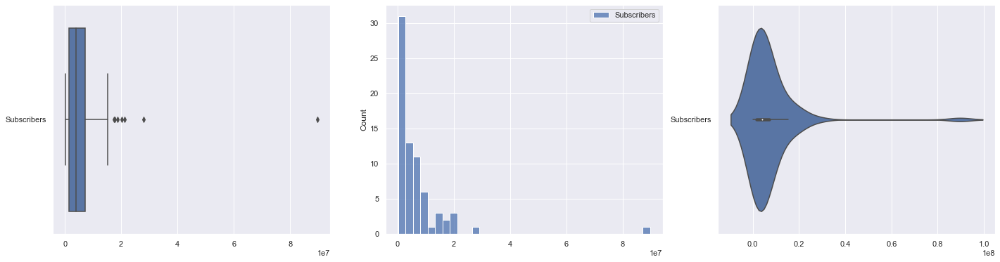


Here displays the heatmap and the Pairplot of all the variables in our Training Data


<Figure size 432x288 with 0 Axes>

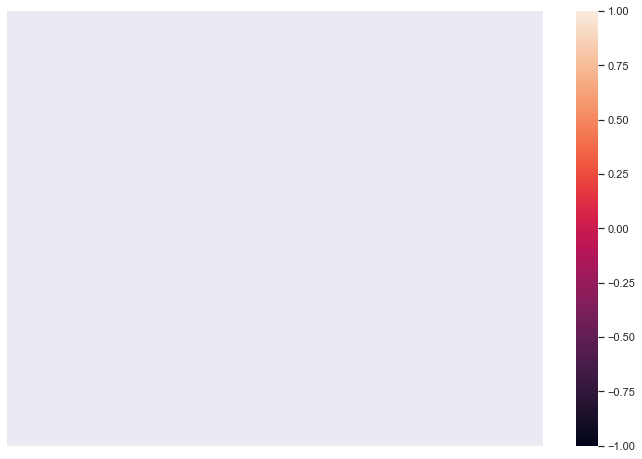

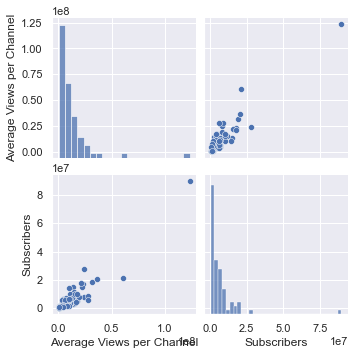


This is the Linear Regression Model predicting Views based on Subsribers in general
Intercept of Regression 	: b =  [2605572.41314024]
Coefficients of Regression 	: a =  [[1.35421769]]



<Figure size 432x288 with 0 Axes>

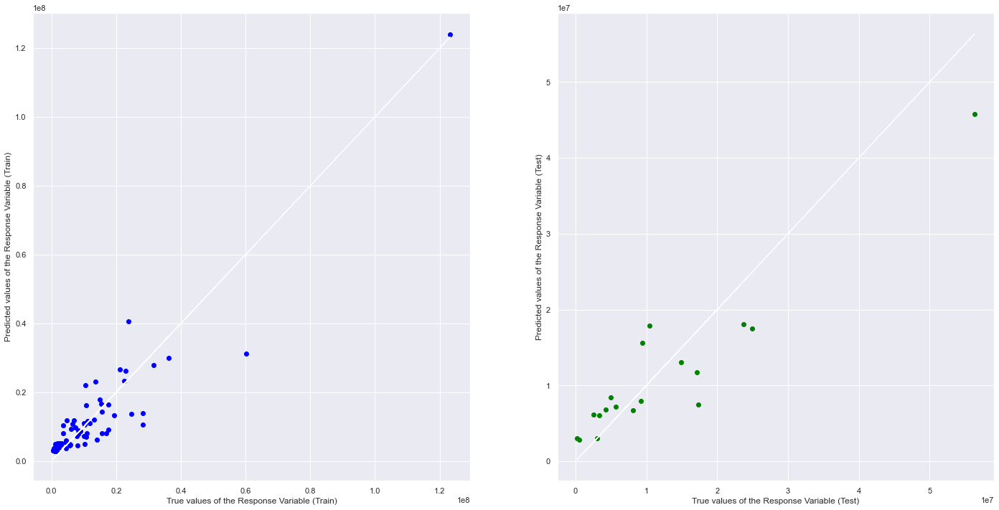


Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.8597628555653181
Mean Squared Error (MSE) 	: 38969792395311.875
Root Mean Squared Error (RMSE) 	: 6242578.985908939

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.8419987630784378
Mean Squared Error (MSE) 	: 26591145166815.28
Root Mean Squared Error (RMSE) 	: 5156660.272581012



In [49]:
m.LRFuncInGen(byChannel, "Subscribers", "Average Views per Channel", 63)

### Conclusion

After our analyses, we have made the following conclusions:
- The multi-variate Linear Regression Model shows that there is a strong relationship between the variables: subscribers, length of video and length of title, and the predictor views. This is true for most categories, except for Video Games, Informative, News and Comedy. <br><br>

- We have found that the number of subscribers has a strong relationship with the number of views. This helps us to solve our problem as it tells advertisers to look out for the number of subscribers when sourcing out channels to advertise their products on.

### Recommendations

To the advertisers, we would recommend the following criteria when looking at YouTubers to collaborate with for sponsorship to maximise customer outreach. As mentioned, the subscriber count of a YouTube channel is a good predictor of the number of views the video could get. Thus, advertisers should choose to sponsor videos from YouTubers with higher subscriber counts in order to get more views and hence maximise customer reach. Also, different categories have different strengths of relationships between the variables and views. As per our multi-variate linear regression model, advertisers are recommended to sponsor the categories with higher prediction accuracies such as “Blog”.